# Sample 15arc-sec GEBCO_2020.nc + Bedmachine on OM4p125 grid

## Apply edits to the topography.
## Apply ice9 algorithm to fill lakes and inland seas. 

In [86]:
# Stephen.Griffies@noaa.gov 
# Alistair.Adcroft@noaa.gov
# Robert.Hallberg@noaa.gov
# Niki.Zadeh@noaa.gov
# Raphael.Dussin@noaa.gov

In [87]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import seaborn as sns
import netCDF4
import xarray as xr
import cmocean
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
%matplotlib inline

In [88]:
sns.set_style('white')
sns.set_context('paper', font_scale=3)
sns.set_palette('hls', 6)
sns.set_style('ticks')

In [89]:
def ice9it(i,j,depth):
  # Iterative implementation of "ice 9"
  wetMask = 0*depth
  (nj,ni) = wetMask.shape
  stack = set()
  stack.add( (j,i) )
  while stack:
    (j,i) = stack.pop()
    if wetMask[j,i] or depth[j,i] >= 0: continue
    wetMask[j,i] = 1
    if i>0: stack.add( (j,i-1) )
    else: stack.add( (j,ni-1) )
    if i<ni-1: stack.add( (j,i+1) )
    else: stack.add( (0,j) )
    if j>0: stack.add( (j-1,i) )
    if j<nj-1: stack.add( (j+1,i) )
    else: stack.add( (j,ni-1-i) )
  return wetMask

In [90]:
def get_indices(lon_grid,lat_grid,x,y):
    """This function returns the j,i indices for the grid point closest to the input lon(i,j),lat(i,j) coordinates."""
    """It returns the j,i indices."""
    
    cost=np.fabs((lon_grid-x)**2 + (lat_grid-y)**2)
    costm=np.where(cost==cost.min())

    j0=costm[0][0]
    i0=costm[1][0]
    
    print("from get_indices, wanted: ",x,y)
    print("from get_indices, got:    ",lon_grid[j0,i0] , lat_grid[j0,i0])
    print(j0,i0)
    return j0,i0


def get_indices_gebco(lon_grid,lat_grid,x,y):
    """This function returns the j,i indices for the grid point closest to the input lon(i),lat(j) coordinates."""
    """It returns the j,i indices."""

    lons=np.fabs(np.squeeze(lon_grid)-x)
    lonm=np.where(lons==lons.min())
    lats=np.fabs(np.squeeze(lat_grid)-y)
    latm=np.where(lats==lats.min())  
    
    j0=latm[0][0]
    i0=lonm[0][0]

    #print("from get_indices_gebco, wanted: ",x,y)
    #print("from get_indices_gebco, got:    ",lon_grid[i0], lat_grid[j0])
    #print(j0,i0)
    return j0,i0

In [91]:
def map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
                           xgridG, ygridG, xgridM, ygridM, 
                           fieldG, fieldMa, fieldMb, fieldMc,
                           vmin, vmax, cmap, rname,
                           iskip, jskip, ioff, joff):
    """This function maps a region centered on (center_lon,center_lat) over (width_lon,width_lat)."""
    
    # GEBCO indices
    jsouthG,iwestG=get_indices_gebco(xgridG, ygridG, (center_lon-width_lon/2),(center_lat-width_lat/2))
    jnorthG,ieastG=get_indices_gebco(xgridG, ygridG, (center_lon+width_lon/2),(center_lat+width_lat/2))
    print('(jsouthG,iwestG) = ',jsouthG,',',iwestG) 
    print('(jnorthG,ieastG) = ',jnorthG,',',ieastG) 
 
    # MOM6 indices 
    jsouthM,iwestM=get_indices(xgridM, ygridM, (center_lon-width_lon/2),(center_lat-width_lat/2))
    jnorthM,ieastM=get_indices(xgridM, ygridM, (center_lon+width_lon/2),(center_lat+width_lat/2))
    print('(jsouthM,iwestM) = ',jsouthM,',',iwestM) 
    print('(jnorthM,ieastM) = ',jnorthM,',',ieastM) 

   
    xlimM=(xgridM[jsouthM:jnorthM,iwestM:ieastM].min(),xgridM[jsouthM:jnorthM,iwestM:ieastM].max())
    ylimM=(ygridM[jsouthM:jnorthM,iwestM:ieastM].min(),ygridM[jsouthM:jnorthM,iwestM:ieastM].max())

    xlimG = (xgridG[iwestG:ieastG].min(),xgridG[iwestG:ieastG].max())
    ylimG = (ygridG[jsouthG:jnorthG].min(),ygridG[jsouthG:jnorthG].max())

    # define the smallest common region to better view/compare the two datasets 
    xlim = (np.array([xlimM[0],xlimG[0]]).max(), np.array([xlimM[1],xlimG[1]]).min())
    ylim = (np.array([ylimM[0],ylimG[0]]).max(), np.array([ylimM[1],ylimG[1]]).min())
     
    xtickslim = (iwestM+ioff,ieastM-ioff)    
    ytickslim = (jsouthM+joff,jnorthM-joff)    
    # print('xtickslim = ',xtickslim) 
        
        
    plt.figure(figsize=(14,10)) 

    
    # GEBCO
    plt.subplot(2,2,1)
    fieldGmask = fieldG[jsouthG:jnorthG,iwestG:ieastG]
    fieldGmask = np.ma.array(fieldGmask, mask=(fieldGmask>=0.0))
    plt.pcolormesh(xgridG[iwestG:ieastG], 
                   ygridG[jsouthG:jnorthG], 
                   fieldGmask,
                   cmap=cmap,linewidths=0.25, 
                   vmin=vmin, vmax=vmax)  
    plt.title('GEBCO-'+rname, fontsize=20)
    plt.xlabel("longitude",fontsize=15)
    plt.gca().set_facecolor('lightgray')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
#    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=12) 
    
    plt.contour(xgridG[iwestG:ieastG], 
                ygridG[jsouthG:jnorthG], 
                fieldG[jsouthG:jnorthG,iwestG:ieastG],
                levels=[-500,0],linestyles='solid',colors='green')  
    plt.xlim(xlim)
    plt.ylim(ylim)
    
    
    
    # MOM6
    # The offset in indices for field is due to pcolormesh conventions
    plt.subplot(2,2,2)
    plt.pcolormesh(xgridM[jsouthM:jnorthM,iwestM:ieastM], 
                   ygridM[jsouthM:jnorthM,iwestM:ieastM], 
                   fieldMa[jsouthM:jnorthM-1,iwestM:ieastM-1],
                   cmap=cmap,linewidths=0.25, 
                   vmin=vmin, vmax=vmax)  
    plt.gca().set_facecolor('lightgray')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
#    cbar = plt.colorbar()
    cbar.ax.tick_params(labelsize=12) 
    plt.xlim(xlim)
    plt.ylim(ylim)
     
    # contour GEBCO over MOM    
    plt.contour(xgridG[iwestG:ieastG], 
                ygridG[jsouthG:jnorthG], 
                fieldG[jsouthG:jnorthG,iwestG:ieastG],
                levels=[-500,0],linestyles='solid',colors='green')  
    
    plt.title('GEBCO(cont)+MOM6-'+rname, fontsize=20)
    plt.xlabel("longitude",fontsize=15)
    plt.xlim(xlim)
    plt.ylim(ylim)
      
        
        
    # MOM6 topog as indices 
    plt.subplot(2,2,3)
    
    xindices = np.arange(iwestM,ieastM)-0.5
    yindices = np.arange(jsouthM,jnorthM)-0.5
    xint     = np.arange(iwestM,ieastM,iskip)
    yint     = np.arange(jsouthM,jnorthM,jskip)

    plt.pcolormesh(xindices, yindices,
                   fieldMb[jsouthM:jnorthM-1,iwestM:ieastM-1],
                   cmap=cmap,linewidths=0.25, 
                   vmin=vmin, vmax=vmax)  
    plt.title('Indices MOM6-'+rname, fontsize=20)
    plt.xlabel("i-index",fontsize=15)
    plt.gca().set_facecolor('lightgray')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
#    cbar = plt.colorbar()
    cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')    
    cbar.ax.tick_params(labelsize=12) 
    plt.yticks(yint)
    plt.xticks(xint)
    plt.xlim(xtickslim)
    plt.ylim(ytickslim)
   

    # MOM6
    # The offset in indices for field is due to pcolormesh conventions
    plt.subplot(2,2,4)
    plt.pcolormesh(xgridM[jsouthM:jnorthM,iwestM:ieastM], 
                   ygridM[jsouthM:jnorthM,iwestM:ieastM], 
                   fieldMc[jsouthM:jnorthM-1,iwestM:ieastM-1],
                   cmap=cmap,linewidths=0.25, 
                   vmin=vmin, vmax=vmax)  
    plt.gca().set_facecolor('lightgray')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
#    cbar = plt.colorbar()
    cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
    cbar.ax.tick_params(labelsize=12) 
    plt.xlim(xlim)
    plt.ylim(ylim)
     
    # contour GEBCO over MOM    
    plt.contour(xgridG[iwestG:ieastG], 
                ygridG[jsouthG:jnorthG], 
                fieldG[jsouthG:jnorthG,iwestG:ieastG],
                levels=[-500,0],linestyles='solid',colors='green')  
    
    plt.title('GEBCO(cont)+edited MOM6-'+rname, fontsize=20)
    plt.xlabel("longitude",fontsize=15)
    plt.xlim(xlim)
    plt.ylim(ylim)    


    plt.tight_layout()
    plt.show()
    
    return

In [92]:
# GEBCO-2020 + Bedmachine combined topography 

fname_gebco  = "/work/Raphael.Dussin/BedMachine_Ant1/merged_BedMachineAntarctic_GEBCO2020.nc"
topog_gebco = netCDF4.Dataset(fname_gebco)

xgebco       = topog_gebco.variables['lon']
ygebco       = topog_gebco.variables['lat']
height_gebco = topog_gebco.variables['elevation']

print('----------------------------------------------------------------------------')
print('GEBCO-2020 dataset = ',fname_gebco)
print('xgebco.shape =', xgebco.shape)
print('ygebco.shape =', ygebco.shape)
print('height_gebco.shape =', height_gebco.shape)
print('----------------------------------------------------------------------------')

----------------------------------------------------------------------------
GEBCO-2020 dataset =  /work/Raphael.Dussin/BedMachine_Ant1/merged_BedMachineAntarctic_GEBCO2020.nc
xgebco.shape = (86400,)
ygebco.shape = (43200,)
height_gebco.shape = (43200, 86400)
----------------------------------------------------------------------------


In [93]:
# 1/8th degree MOM6 topography (has no application of ice9)

fname_model = "/work/Niki.Zadeh/MOM6-examples_myfork/ice_ocean_SIS2/OM4_0125/preprocessing.2.BedMachineTopo_Raph/topog_merged.nc"
topog_model = netCDF4.Dataset(fname_model)

fname_grid_model = "/work/Niki.Zadeh/MOM6-examples_myfork/ice_ocean_SIS2/OM4_0125/preprocessing.2/ocean_hgrid.nc"
grid_model       = netCDF4.Dataset(fname_grid_model)

print('----------------------------------------------------------------------------')
print(fname_grid_model)
print(grid_model)
print('----------------------------------------------------------------------------')
print(fname_model)
print(topog_model)
print('----------------------------------------------------------------------------')

# vorticity (q) points (best for pcolormesh to have edges of fields)
xmodel_q = grid_model.variables['x'][:][::2,::2]
ymodel_q = grid_model.variables['y'][:][::2,::2]

# thickness points
xmodel_h = grid_model.variables['x'][:][1::2,1::2]
ymodel_h = grid_model.variables['y'][:][1::2,1::2]

# define height = -depth corresponding to gebco
depth_model    = topog_model.variables['depth']
depth_model    = np.ma.masked_less(depth_model, 0.0, copy=True)

# define height_model to be edited and fixed (unedited) height_model0
height_model   = topog_model.variables['height']
height_model   = np.ma.masked_greater(height_model, 0.0, copy=True)
height_model0  = topog_model.variables['height']
height_model0  = np.ma.masked_greater(height_model0, 0.0, copy=True)

wet_model      = np.zeros(height_model.shape)
wet_model      = np.where(height_model<0.,1.0,0.0)

# sanity check that depth = -height in fact holds (it does)
diff_model     = height_model + depth_model 

# ymodel is in degrees. np.sin() wants radians. 
# ymodel is latitude even when north of bipolar fold.
# -1.0 to account for height = -depth
Omega    = 7.2921/1e5
coriolis = 2.0 * Omega * np.sin(ymodel_h*np.pi/180.0) * wet_model
foverh   = -1.0*coriolis/height_model

# for maps near lon=60=-300
# *8 since 1/8th degree 
shift = 60*8
# recall that x += 1 is short for x = x + 1, same for -=
height_model0_roll = np.roll(height_model0,shift,axis=1)
ymodel_q_roll      = np.roll(ymodel_q,shift,axis=1)
xmodel_q_roll      = np.roll(xmodel_q,shift,axis=1)
xmodel_q_roll[:,:shift] -= 360
xmodel_q_roll += 360.

#print('depth_model.shape = ',depth_model.shape, 'coriolis.shape = ',coriolis.shape, 'foverh shape = ',foverh.shape )

----------------------------------------------------------------------------
/work/Niki.Zadeh/MOM6-examples_myfork/ice_ocean_SIS2/OM4_0125/preprocessing.2/ocean_hgrid.nc
<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_64BIT_OFFSET data model, file format NETCDF3):
    history: This grid file was generated via command pytools/grid_generation/ocean_grid_generator.py --write_subgrid_files -f ocean_hgrid.nc -r 8 --rdp 0.2 --south_cutoff_row 5 --match_dy --even_j on 2020-08-13 on platform an004
    description: This is an orthogonal coordinate grid for the Earth with a nominal resoution of 0.125 degrees along the equator. It consists of a Mercator grid spanning -66.8840965847 to 64.0316059408 degrees, flanked by a bipolar northern cap and a regular lat-lon grid spanning -66.8840965847 to -78.0 degrees. It is capped by a displaced pole grid south of -78.0 degrees. The first 5 rows at south are deleted.
    source: pytools/grid_generation/ocean_grid_generator.py had git hash 136ffe549c

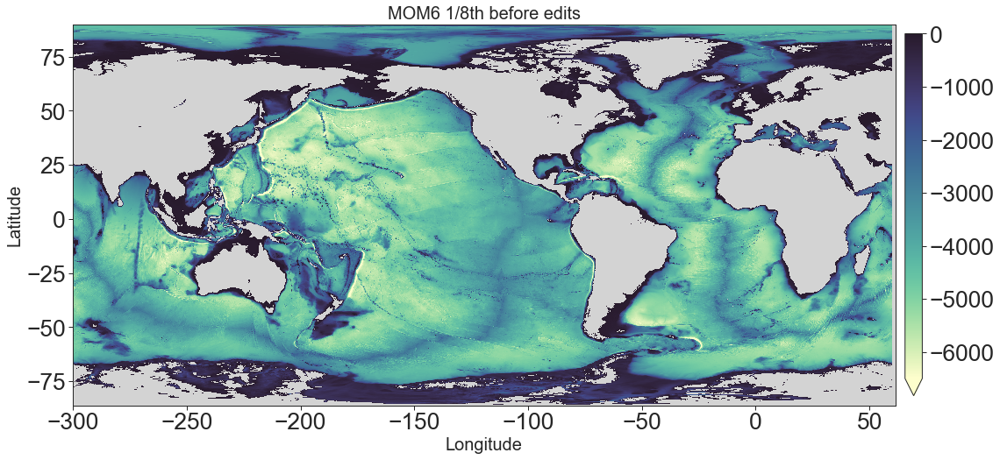

In [94]:
#MOM topog height before any edits 

vmax=0.0
vmin=-6500.0
field = height_model
x = xmodel_q
y = ymodel_q

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=15)
#plt.yticks(fontsize=15)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')

plt.title('MOM6 1/8th before edits', fontsize=20)
#cbar.ax.tick_params(labelsize=8) 
   
plt.show()

In [95]:
# ---------------------------------------------------------------------- 
# -------------------Mediterranean and Black Seas----------------------- 
# ---------------------------------------------------------------------- 

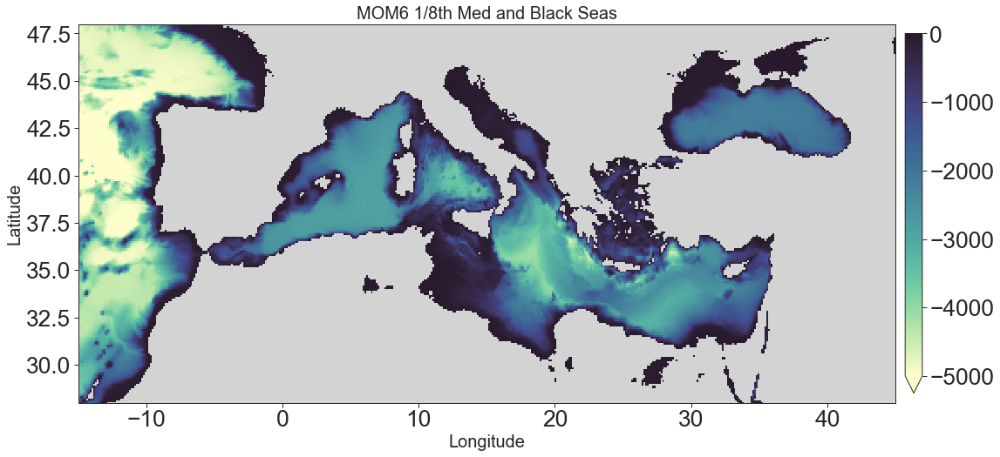

In [96]:
#Broad view of Med and Black Sea before edits 

vmax=0.0
vmin=-5000.0
field = height_model0
x = xmodel_q
y = ymodel_q
xlim = (-15,45)
ylim = (28,48)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')

plt.title('MOM6 1/8th Med and Black Seas', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

(jsouthG,iwestG) =  30119 , 41699
(jnorthG,ieastG) =  30359 , 42059
from get_indices, wanted:  -6.25 35.5
from get_indices, got:     -6.25 35.5369943795848
1398 2350
from get_indices, wanted:  -4.75 36.5
from get_indices, got:     -4.75 36.547695354508164
1408 2362
(jsouthM,iwestM) =  1398 , 2350
(jnorthM,ieastM) =  1408 , 2362


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


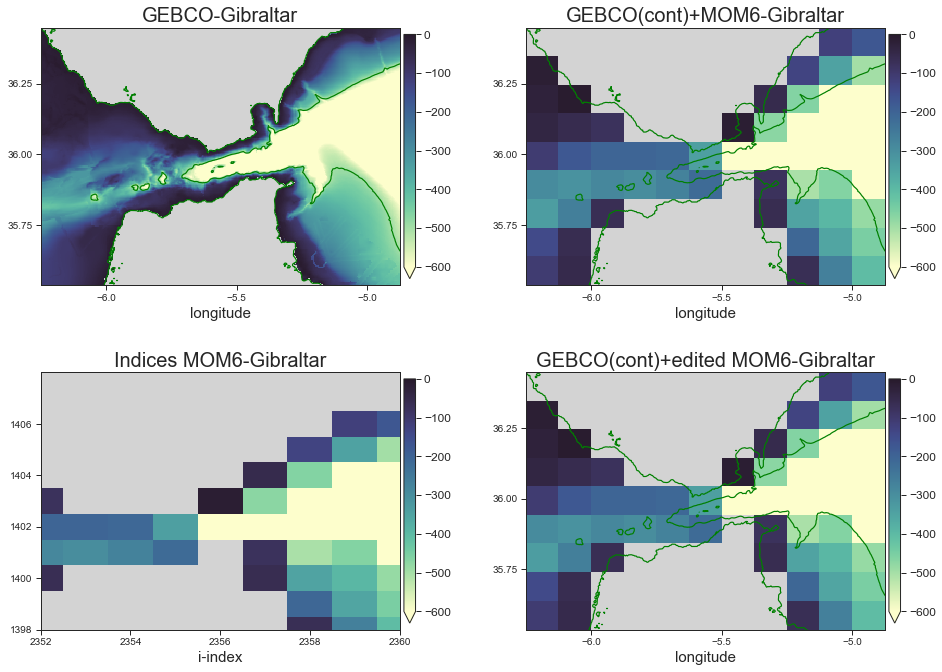

In [97]:
# Close look at Strait of Gibraltar (no edits)
#
# Ensure Camarinal sill exists at narrowest point of Gibraltar.
# Note that Wikipedia says it is roughly 300m deep at 35deg 56min N and 5deg 45min W.
# But GEBCO has it deeper.  Will keep objective mapping of GEBCO.
#
# For the file MOM6-examples/ice_ocean_SIS2/OM4_0125/INPUT/MOM_channels_global_0125
# to have a 12km wide opening at Gibraltar 
# U_width,  -5.7,  -5.4, 35.8, 36.2,  12000.0  ! Gibraltar


fieldA = height_model0
#center_lon=-5.50 ; center_lat=36. ; width_lon=1.5 ; width_lat=.60
center_lon=-5.50 ; center_lat=36. ; width_lon=1.5 ; width_lat=1.0

vmin=-600.0 ; vmax=0.0; 
map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Gibraltar', iskip=2, jskip=2, ioff=2, joff=0)


(jsouthG,iwestG) =  32039 , 51719
(jnorthG,ieastG) =  32759 , 52439
from get_indices, wanted:  35.5 43.5
from get_indices, got:     35.5 43.5237698952794
1481 2684
from get_indices, wanted:  38.5 46.5
from get_indices, got:     38.5 46.526619056400776
1515 2708
(jsouthM,iwestM) =  1481 , 2684
(jnorthM,ieastM) =  1515 , 2708


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


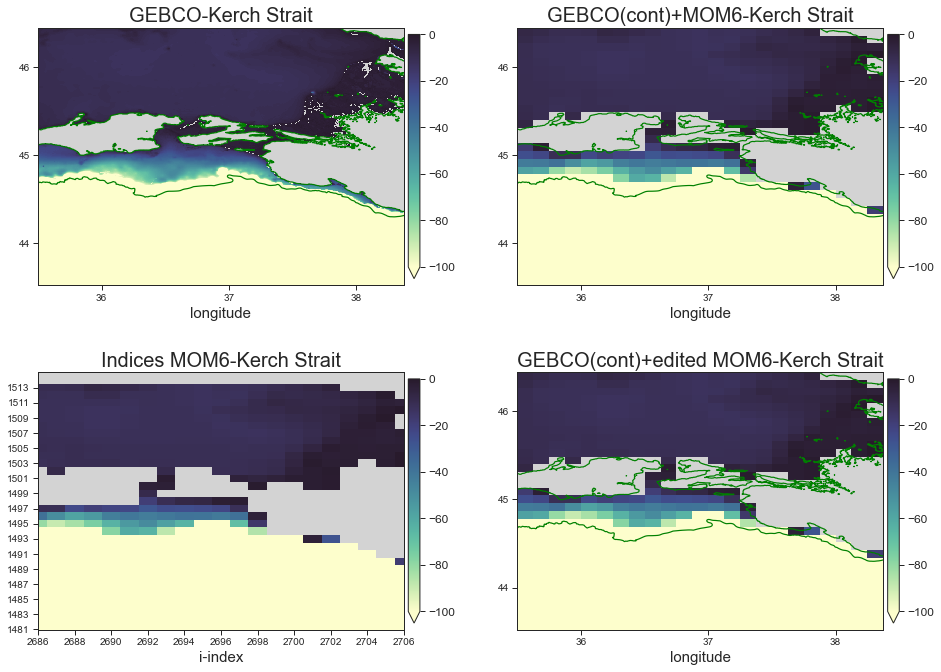

In [98]:
#Verify that the Kerch Strait is open without any edits (connects Sea of Azov to Black Sea)

fieldA = height_model0
center_lon=37.0 ; center_lat=45. ; width_lon=3.0 ; width_lat=3.0
vmin=-100.0 ; vmax=0.0; 

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Kerch Strait', iskip=2, jskip=2, ioff=2, joff=0)

(jsouthG,iwestG) =  31379 , 50064
(jnorthG,ieastG) =  31619 , 50304
from get_indices, wanted:  28.6 40.75
from get_indices, got:     28.625 40.74355765955596
1451 2629
from get_indices, wanted:  29.6 41.75
from get_indices, got:     29.625 41.777138052969796
1462 2637
(jsouthM,iwestM) =  1451 , 2629
(jnorthM,ieastM) =  1462 , 2637


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


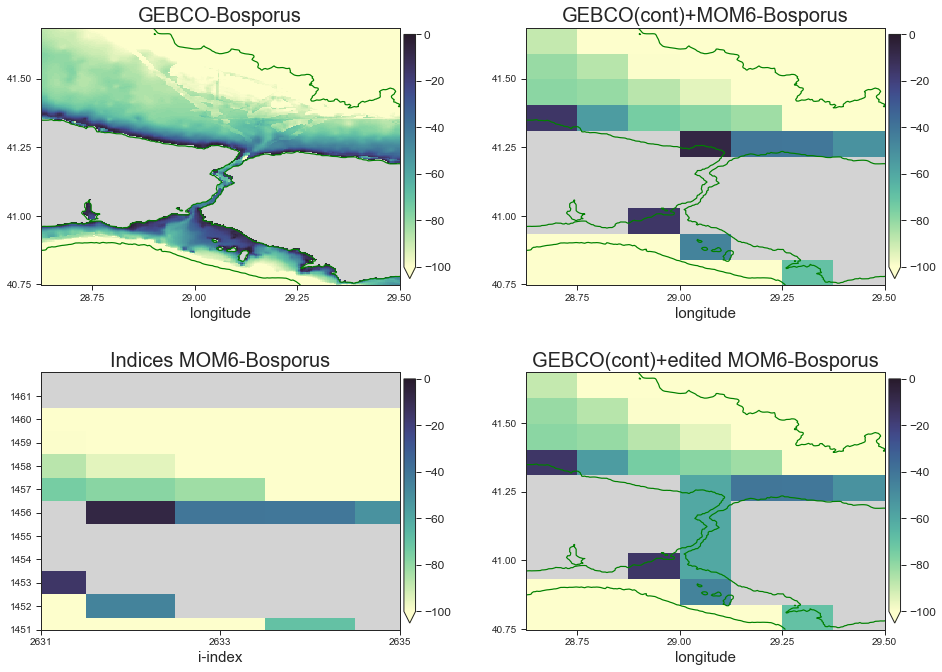

In [99]:
#Edit to open the Bosporus region at the southern exit of the Black Sea

# For the file MOM6-examples/ice_ocean_SIS2/OM4_0125/INPUT/MOM_channels_global_0125
# V_width,  28.8,  29.4, 41.1, 41.2,   1250.0  ! Bosporus - should be 1km wide.


fieldA = height_model0
center_lon=29.10 ; center_lat=41.25 ; width_lon=1.0 ; width_lat=1.0
vmin=-100.0 ; vmax=0.0; 

# Bosphorus 
height_model[1456,2632] = -60.0
height_model[1455,2632] = -60.0
height_model[1454,2632] = -60.0
height_model[1453,2632] = -60.0

# connect a piece of the Sea of Marmara to remainder of that sea 
height_model[1447,2630] = -60.0

# If set any point to zero then need to mask it.
#fieldMb = np.ma.array(fieldMb,mask=fieldMb>=0.0)

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Bosporus', iskip=2, jskip=1, ioff=2, joff=0)

(jsouthG,iwestG) =  31199 , 49392
(jnorthG,ieastG) =  31439 , 49872
from get_indices, wanted:  25.8 40.0
from get_indices, got:     25.75 39.981609996241666
1443 2606
from get_indices, wanted:  27.8 41.0
from get_indices, got:     27.75 41.02706492342095
1454 2622
(jsouthM,iwestM) =  1443 , 2606
(jnorthM,ieastM) =  1454 , 2622


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


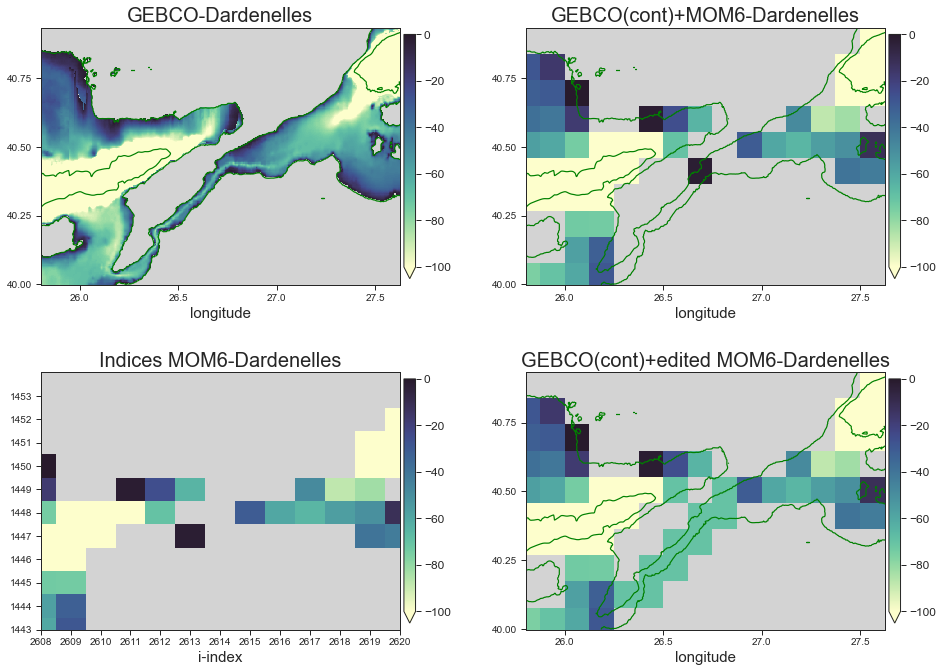

In [100]:
#Edits needed to open the Dardenelles connecting the Sea of Marmara to the Aegean Sea 

# For the file MOM6-examples/ice_ocean_SIS2/OM4_0125/INPUT/MOM_channels_global_0125
# U_width,  26.4, 26.7, 40.3, 40.5,   5000.0  ! Dardanelles

fieldA = height_model0
center_lon=26.80 ; center_lat=40.50 ; width_lon=2.0 ; width_lat=1.0
vmin=-100.0 ; vmax=0.0; 

# Dardenelles 
height_model[1447,2614] = -70.0
height_model[1448,2614] = -70.0
height_model[1447,2613] = -70.0
height_model[1446,2613] = -70.0
height_model[1446,2612] = -70.0
height_model[1445,2612] = -70.0
height_model[1445,2611] = -70.0
height_model[1444,2611] = -70.0
height_model[1444,2610] = -70.0

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Dardenelles', iskip=1, jskip=1, ioff=2, joff=0)

(jsouthG,iwestG) =  30569 , 48239
(jnorthG,ieastG) =  30869 , 48719
from get_indices, wanted:  21.0 37.375
from get_indices, got:     21.0 37.346870440404
1416 2568
from get_indices, wanted:  23.0 38.625
from get_indices, got:     23.0 38.627552006721295
1429 2584
(jsouthM,iwestM) =  1416 , 2568
(jnorthM,ieastM) =  1429 , 2584


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


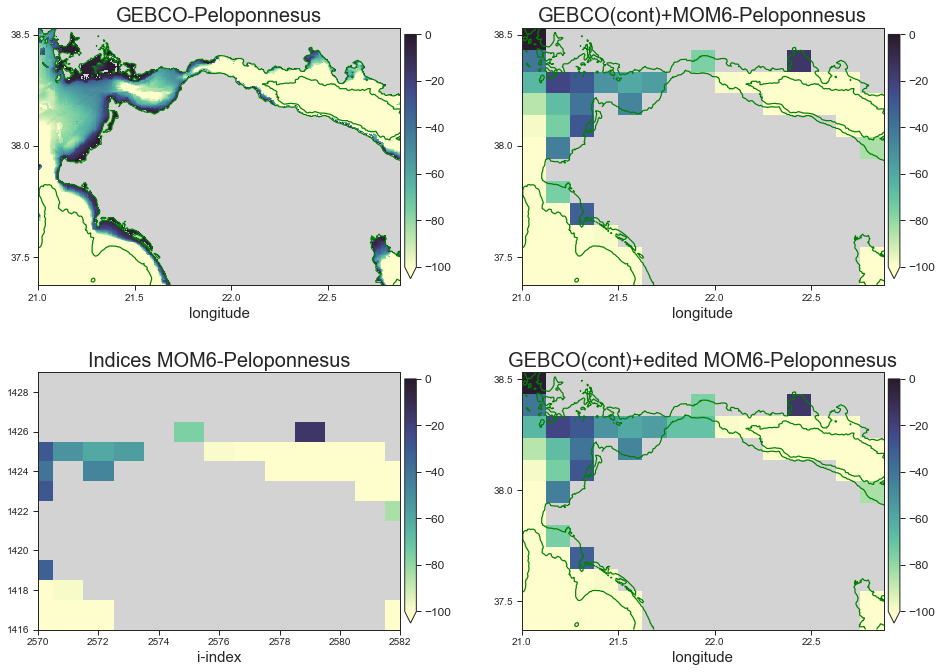

In [101]:
#Edits needed to open the northern part of Peloponnesus peninsula of Greece 

fieldA = height_model0
center_lon=22.0 ; center_lat=38. ; width_lon=2.0 ; width_lat=1.25
vmin=-100.0 ; vmax=0.0; 

height_model[1425,2574] = -70.0
height_model[1425,2575] = -70.0

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Peloponnesus', iskip=2, jskip=2, ioff=2, joff=0)

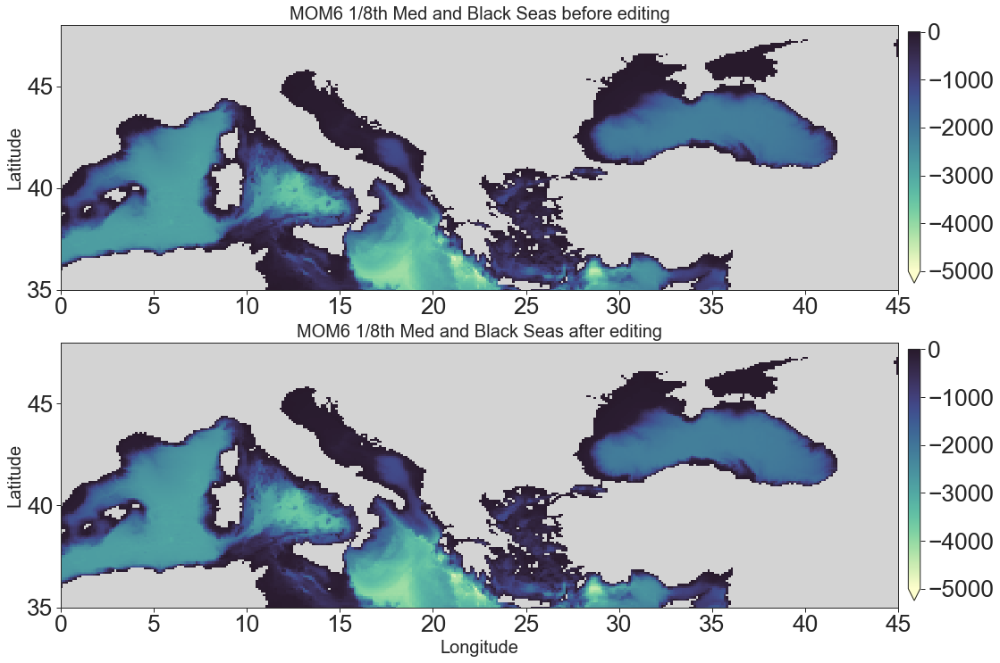

In [102]:
# Broad view of Med and Black Sea after editing 
#
# Warning: the dpi on a typical screen might be insufficient 
# to resolve all the land/sea connections. The Peloponnesus peninsula
# is a good case-in-point where some screen resolutions might show this peninsula  
# disconnected to the rest of Greece, whereas it is in fact connected (as we see in the 
# above cell).  

vmax=0.0
vmin=-5000.0
x = xmodel_q
y = ymodel_q

xlim = (-10,45)
ylim = (29,48)

xlim = (0,45)
ylim = (35,48)

plt.figure(figsize=(20,12))

plt.subplot(2,1,1)
field = height_model0
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
#plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('MOM6 1/8th Med and Black Seas before editing', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)   

plt.subplot(2,1,2)
field = height_model
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('MOM6 1/8th Med and Black Seas after editing', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)   

   
plt.show()

In [103]:
# ---------------------------------------------------------------------- 
# --------------Red Sea-------------------------------------------------
# ---------------------------------------------------------------------- 

(jsouthG,iwestG) =  27719 , 50759
(jnorthG,ieastG) =  29399 , 52439
from get_indices, wanted:  31.5 25.5
from get_indices, got:     31.5 25.54640644129988
1305 2652
from get_indices, wanted:  38.5 32.5
from get_indices, got:     38.5 32.533641079783855
1369 2708
(jsouthM,iwestM) =  1305 , 2652
(jnorthM,ieastM) =  1369 , 2708


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


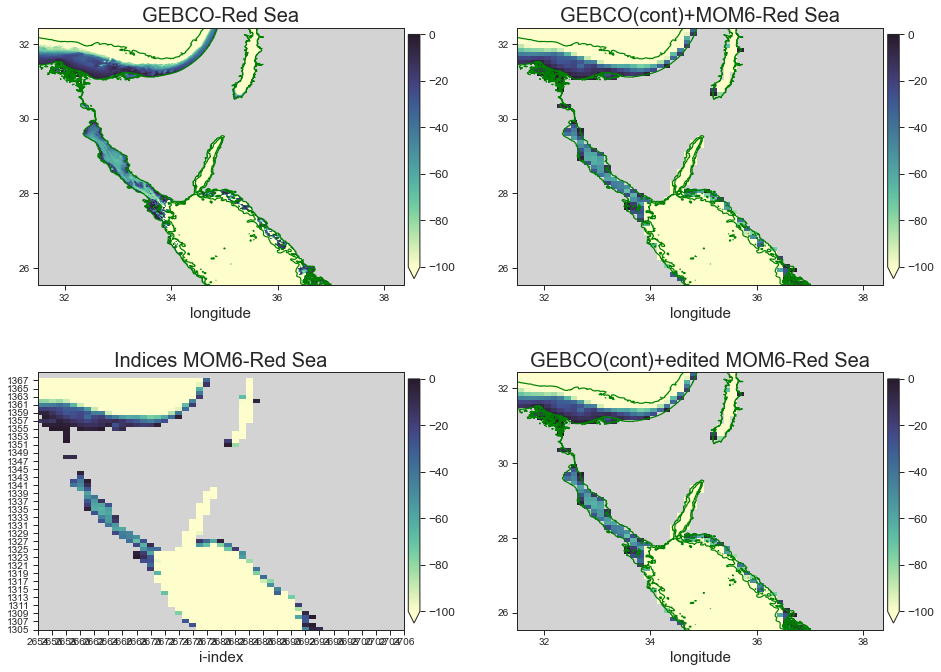

In [104]:
#View of northern Red Sea (no edits) 

fieldA = height_model0
center_lon=35.0 ; center_lat=29. ; width_lon=7.0 ; width_lat=7.0
vmin=-100.0 ; vmax=0.0; 

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Red Sea', iskip=2, jskip=2, ioff=2, joff=0)

(jsouthG,iwestG) =  24479 , 53399
(jnorthG,ieastG) =  24959 , 53879
from get_indices, wanted:  42.5 12.0
from get_indices, got:     42.5 11.974367096851147
1190 2740
from get_indices, wanted:  44.5 14.0
from get_indices, got:     44.5 14.04469925079598
1207 2756
(jsouthM,iwestM) =  1190 , 2740
(jnorthM,ieastM) =  1207 , 2756


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


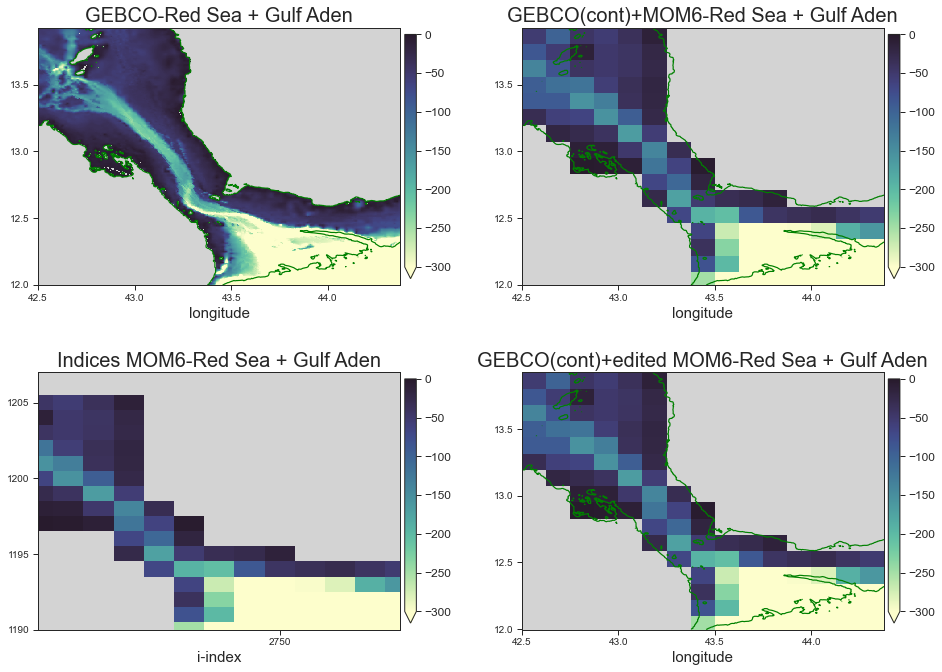

In [105]:
#View of southern Red Sea and Gulf of Aden (no edits)

fieldA = height_model0
center_lon=43.50 ; center_lat=13. ; width_lon=2.0 ; width_lat=2.0
vmin=-300.0 ; vmax=0.0; 

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Red Sea + Gulf Aden', iskip=10, jskip=5, ioff=2, joff=0)

In [106]:
# ---------------------------------------------------------------------- 
# --------------Persian Gulf-------------------------------------------- 
# ---------------------------------------------------------------------- 

(jsouthG,iwestG) =  26639 , 54599
(jnorthG,ieastG) =  29039 , 58199
from get_indices, wanted:  47.5 21.0
from get_indices, got:     47.5 20.954143956502424
1265 379
from get_indices, wanted:  62.5 31.0
from get_indices, got:     62.5 31.046240851079144
1355 500
(jsouthM,iwestM) =  1265 , 379
(jnorthM,ieastM) =  1355 , 500


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


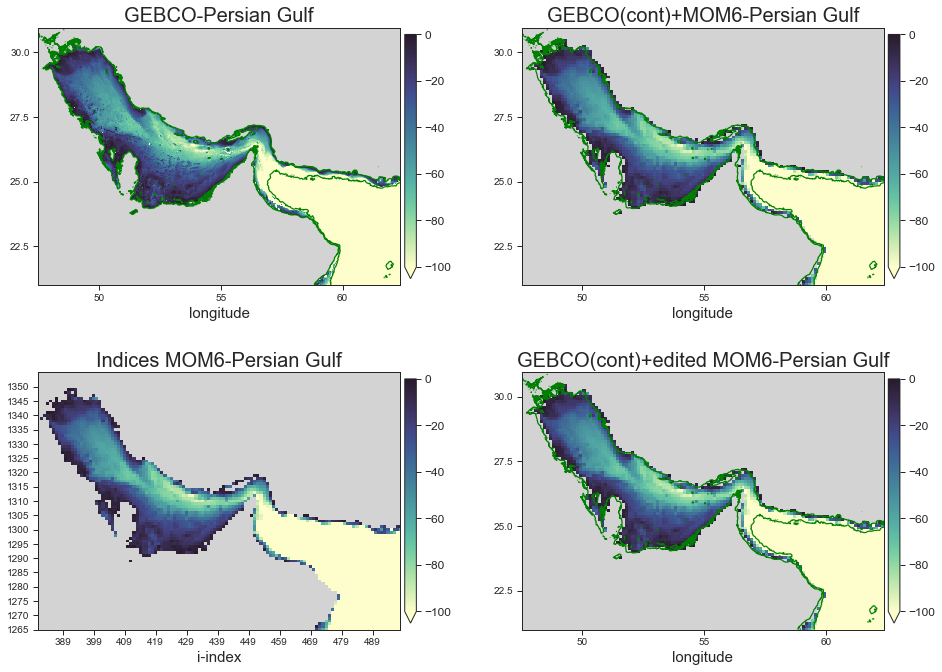

In [107]:
# View of the Persian Gulf (no edits)

# for periodicity across x=60=-300 in model space. 
# *8 since 1/8th degree 
shift = 60*8
# recall that x += 1 is short for x = x + 1, same for -=
height_model_roll  = np.roll(height_model,shift,axis=1)

fieldA = height_model_roll
center_lon=55.0 ; center_lat=26. ; width_lon=15.0 ; width_lat=10.0
vmin=-100.0 ; vmax=0.0; 

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Persian Gulf', iskip=10, jskip=5, ioff=2, joff=0)

(jsouthG,iwestG) =  27239 , 55199
(jnorthG,ieastG) =  27959 , 55679
from get_indices, wanted:  50.0 23.5
from get_indices, got:     50.0 23.49952189527563
1287 2800
from get_indices, wanted:  52.0 26.5
from get_indices, got:     52.0 26.445218922787824
1313 2816
(jsouthM,iwestM) =  1287 , 2800
(jnorthM,ieastM) =  1313 , 2816


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


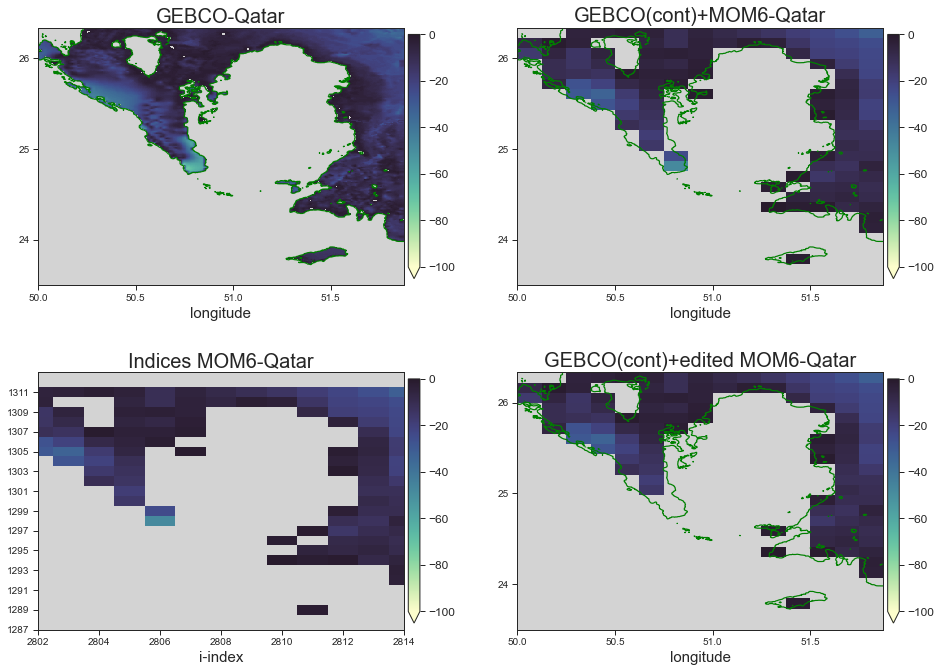

In [108]:
# Edits to fill some spots around Qatar to avoid small embayments that can 
# have excessive evaporation and thus get huge (> 60ppt) salinity.  
# Do not worry about land-locked points that will later be taken care of by ICE9.

fieldA = height_model0
center_lon=51.0 ; center_lat=25. ; width_lon=2.0 ; width_lat=3.0
vmin=-100.0 ; vmax=0.0; 

height_model[1297,2811] = 0.0
height_model[1295,2811] = 0.0
height_model[1294,2811] = 0.0

height_model[1298,2806] = 0.0
height_model[1299,2806] = 0.0

height_model[1305,2807] = 0.0


# If set any point to zero then need to mask it.
height_model = np.ma.array(height_model,mask=height_model>=0.0)


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Qatar', iskip=2, jskip=2, ioff=2, joff=0)

In [109]:
# -----------------------------------------------------------------------------
# -----------------Indian Ocean-----------------------------------------------
# -----------------------------------------------------------------------------

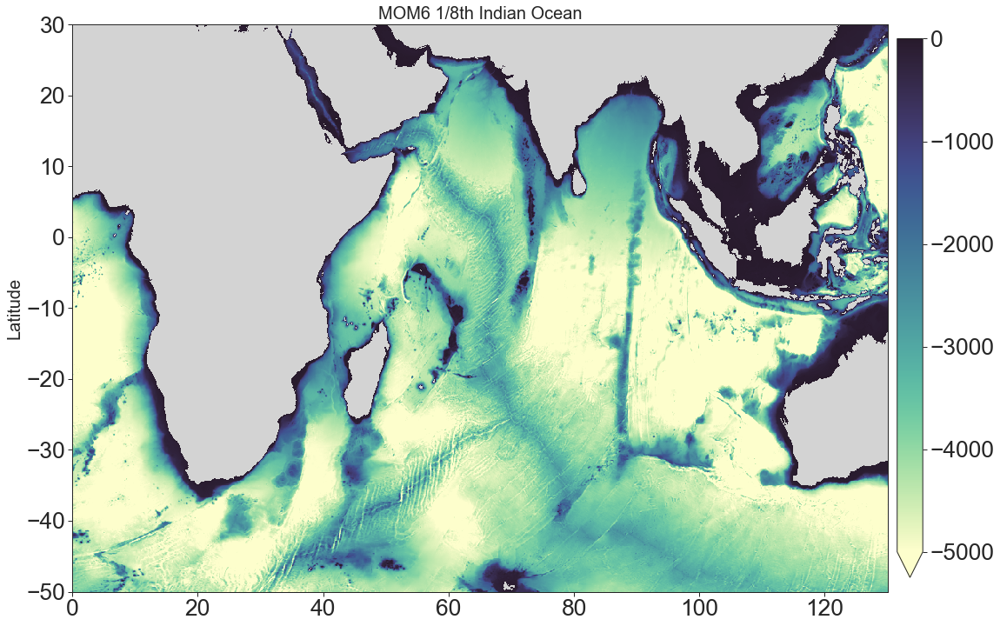

In [110]:
# Broad view of Indian Ocean (no edits)
#
# for periodicity across x=60=-300 in model space. 
# *8 since 1/8th degree 
shift = 60*8
# recall that x += 1 is short for x = x + 1, same for -=
height_model_roll  = np.roll(height_model,shift,axis=1)
field = height_model_roll

vmax=0.0
vmin=-5000.0
x = xmodel_q_roll
y = ymodel_q_roll

xlim = (0,130)
ylim = (-50,30)

plt.figure(figsize=(20,12))

#plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
#               vmin=vmin, vmax=vmax)  

plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25,vmin=vmin, vmax=vmax)  

plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
#plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('MOM6 1/8th Indian Ocean', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)   
   
plt.show()

In [111]:
# ---------------------------------------------------------------------- 
# -----------------Indonesian Islands-----------------------------------
# ---------------------------------------------------------------------- 

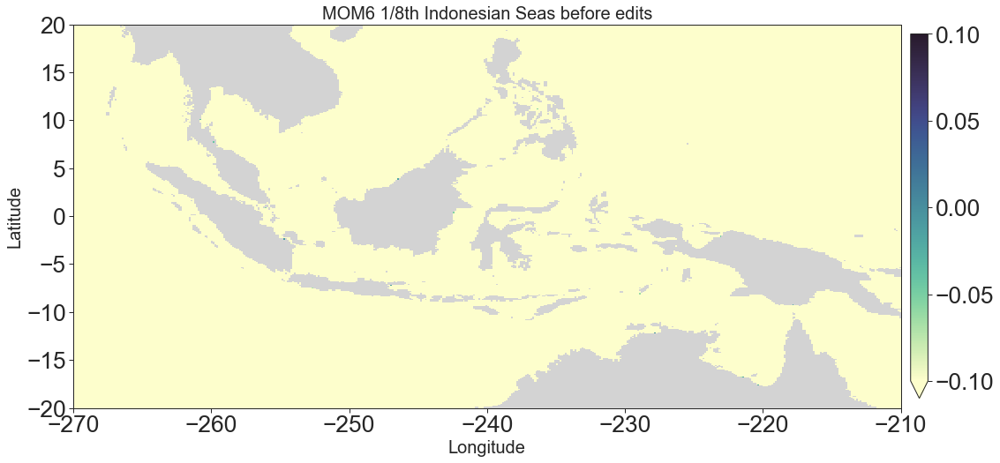

In [112]:
#Broad view of Indonesian Seas before edits 

vmax=0.0
vmin=-0.0
field = height_model0
x = xmodel_q
y = ymodel_q
xlim = (-270,-210)
ylim = (-20,20)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
#cbar = plt.colorbar()
plt.title('MOM6 1/8th Indonesian Seas before edits', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

(jsouthG,iwestG) =  19919 , 68400
(jnorthG,ieastG) =  20399 , 68880
from get_indices, wanted:  105.0 -7.0
from get_indices, got:     105.0 -7.044683051116334
1037 840
from get_indices, wanted:  107.0 -5.0
from get_indices, got:     107.0 -5.055925661656447
1053 856
(jsouthM,iwestM) =  1037 , 840
(jnorthM,ieastM) =  1053 , 856


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


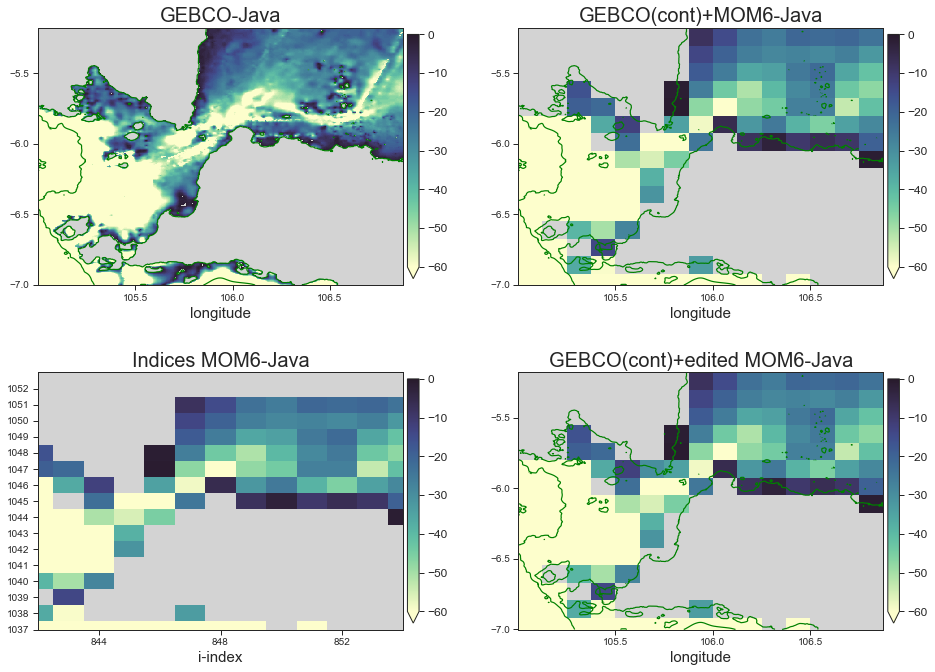

In [113]:
# Sunda Strait between Sumatra and Java (edits made)
# Edit to excavate one point on Sumatra to open the strait a bit more 

shift = 60*8
# recall that x += 1 is short for x = x + 1, same for -=
height_model_roll  = np.roll(height_model,shift,axis=1)

height_model_roll[1046,845] = -30.0

# now back out the roll in modifying height_model
shift = -60*8
height_model = np.roll(height_model_roll,shift,axis=1)


fieldA = height_model0_roll
center_lon=106 ; center_lat=-6.0 ; width_lon=2.0 ; width_lat=2.0
vmin=-60.0 ; vmax=0.0; 

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Java', iskip=4, jskip=1, ioff=2, joff=0)

(jsouthG,iwestG) =  19439 , 70560
(jnorthG,ieastG) =  19824 , 71040
from get_indices, wanted:  114.0 -9.0
from get_indices, got:     114.0 -9.024947190177215
1021 912
from get_indices, wanted:  116.0 -7.3999999999999995
from get_indices, got:     116.0 -7.416700159763667
1034 928
(jsouthM,iwestM) =  1021 , 912
(jnorthM,ieastM) =  1034 , 928


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


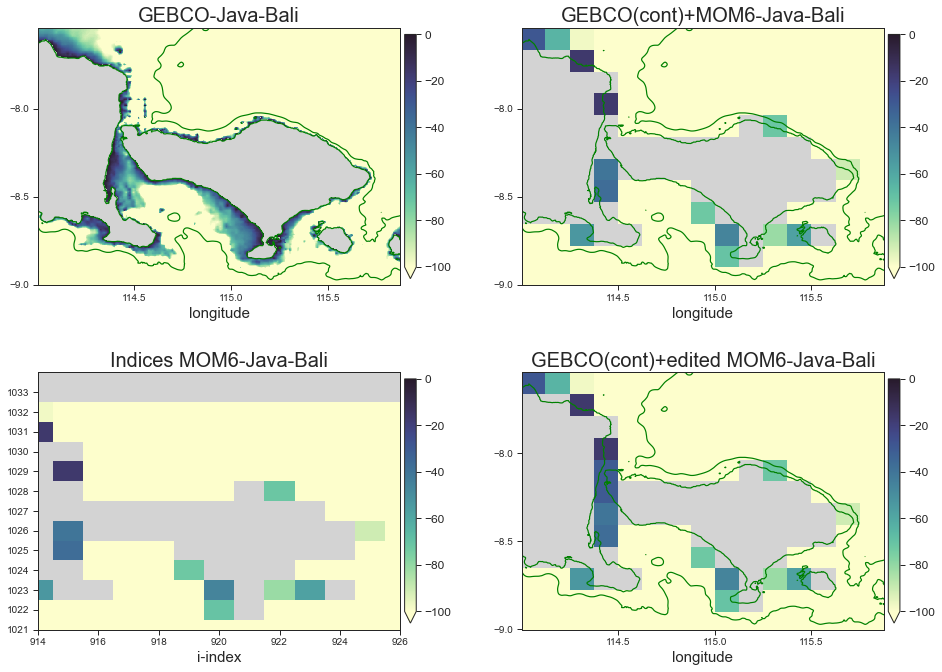

In [114]:
# Edits to separate Java from Bali (edits made)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)
height_model_roll[1027,915] = -30.0
height_model_roll[1028,915] = -30.0

# now back out the roll in modifying height_model
shift = -60*8
height_model  = np.roll(height_model_roll,shift,axis=1)

fieldA = height_model0_roll
center_lon=115 ; center_lat=-8.2 ; width_lon=2.0 ; width_lat=1.6
vmin=-100.0 ; vmax=0.0; 

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Java-Bali', iskip=2, jskip=1, ioff=2, joff=0)

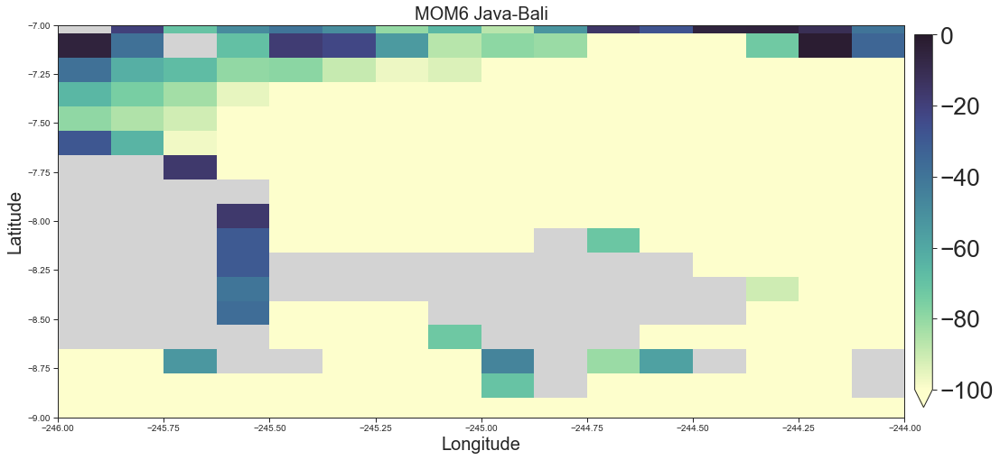

In [115]:
#Sanity check that the above roll-trick worked on height_model
#to separate Java from Bali.

vmax=0.0
vmin=-100.0
field = height_model
x = xmodel_q
y = ymodel_q
xlim = (-246,-244)
ylim = (-9,-7)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('MOM6 Java-Bali', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

(jsouthG,iwestG) =  19379 , 71040
(jnorthG,ieastG) =  19739 , 71760
from get_indices, wanted:  116.0 -9.25
from get_indices, got:     116.0 -9.271766982232993
1019 928
from get_indices, wanted:  119.0 -7.75
from get_indices, got:     119.0 -7.788403103203727
1031 952
(jsouthM,iwestM) =  1019 , 928
(jnorthM,ieastM) =  1031 , 952


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


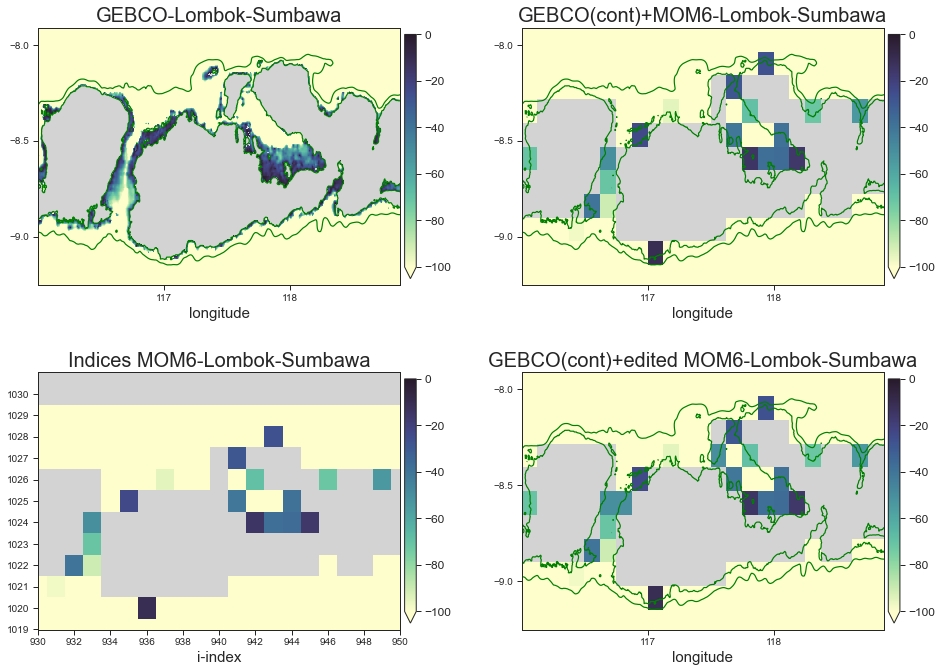

In [116]:
# Edit to separate Lombok from Sumbawa and open up a bit of Sumbawa (edits made)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)

# separate Lombok from Sumbawa
height_model_roll[1024,934] = -50.0

# open up a bit of Sumbawa
height_model_roll[1026,940] = -50.0


# now back out the roll and place into height_model (need to check this!)
shift = -60*8
height_model  = np.roll(height_model_roll,shift,axis=1)


fieldA = height_model0_roll
center_lon=117.5 ; center_lat=-8.5 ; width_lon=3.0 ; width_lat=1.5
vmin=-100.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Lombok-Sumbawa', iskip=2, jskip=1, ioff=2, joff=0)

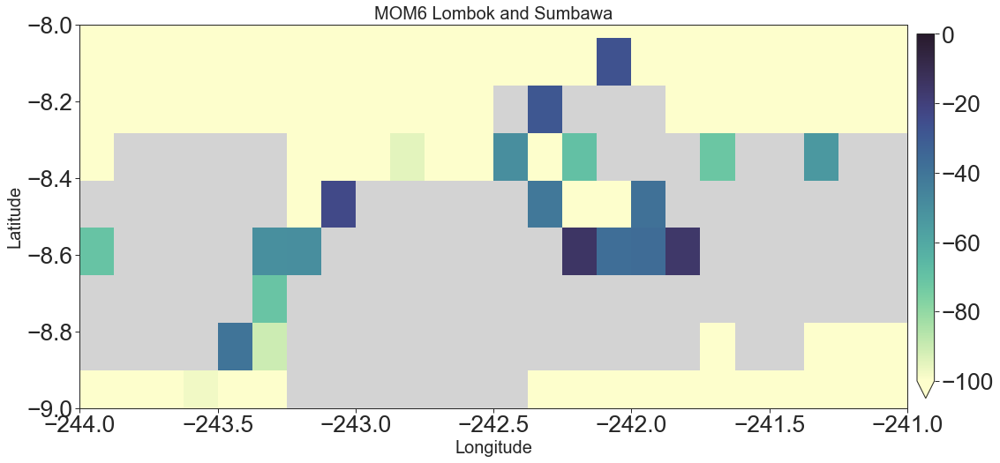

In [117]:
#Verify that that above roll-trick worked on height_model in 
# separating Lombok from Sumbawa and open up a bit of Sumbawa 

vmax=0.0
vmin=-100.0
field = height_model
x = xmodel_q
y = ymodel_q
xlim = (-244,-241)
ylim = (-9,-8)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('MOM6 Lombok and Sumbawa', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

(jsouthG,iwestG) =  19379 , 71520
(jnorthG,ieastG) =  19739 , 72480
from get_indices, wanted:  118.0 -9.25
from get_indices, got:     118.0 -9.271766982232993
1019 944
from get_indices, wanted:  122.0 -7.75
from get_indices, got:     122.0 -7.788403103203727
1031 976
(jsouthM,iwestM) =  1019 , 944
(jnorthM,ieastM) =  1031 , 976


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


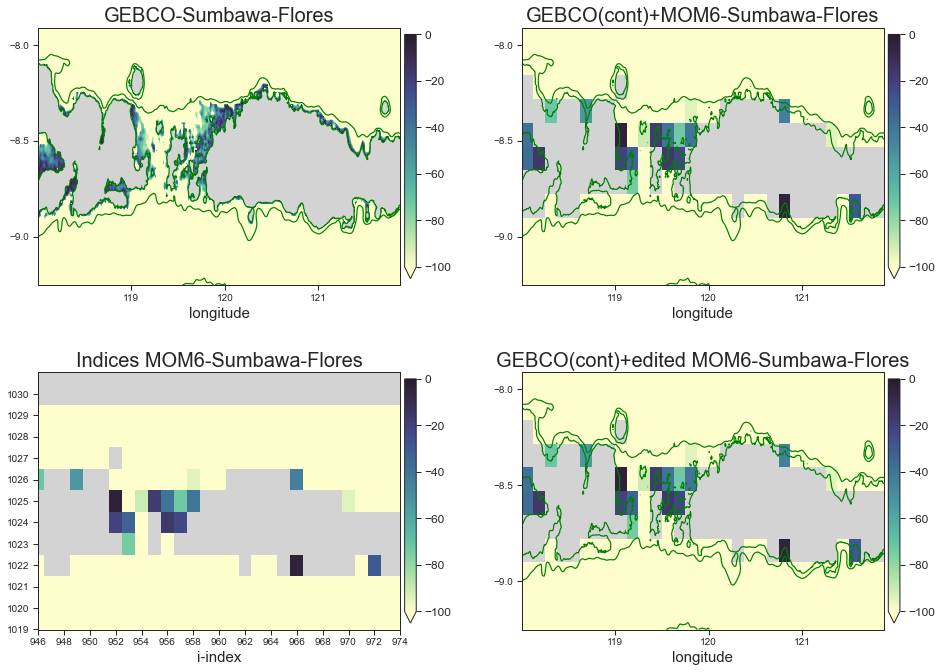

In [118]:
# View of further east between Sumbawa and Flores islands (no edits)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)


# now back out the roll and place into height_model (need to check this!)
#shift = -60*8
#height_model  = np.roll(height_model_roll,shift,axis=1)


fieldA = height_model0_roll
center_lon=120. ; center_lat=-8.5 ; width_lon=4.0 ; width_lat=1.5
vmin=-100.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Sumbawa-Flores', iskip=2, jskip=1, ioff=2, joff=0)

(jsouthG,iwestG) =  19379 , 72000
(jnorthG,ieastG) =  19739 , 72960
from get_indices, wanted:  120.0 -9.25
from get_indices, got:     120.0 -9.271766982232993
1019 960
from get_indices, wanted:  124.0 -7.75
from get_indices, got:     124.0 -7.788403103203727
1031 992
(jsouthM,iwestM) =  1019 , 960
(jnorthM,ieastM) =  1031 , 992


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


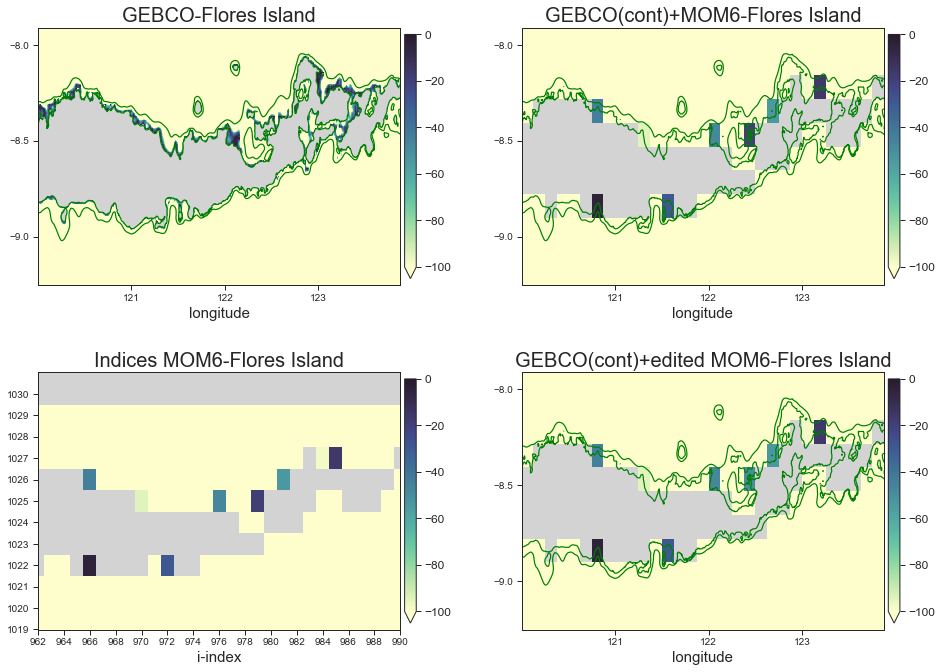

In [119]:
# Edits to fill in a spot along Flores island and deepen one spot (edits made)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)
height_model_roll[1023,980] = 0.0
height_model_roll[1025,979] = -50.0

height_model_roll = np.ma.array(height_model_roll,mask=height_model_roll>=0.0)

# now back out the roll and place into height_model (need to check this!)
shift = -60*8
height_model  = np.roll(height_model_roll,shift,axis=1)


fieldA = height_model0_roll
center_lon=122. ; center_lat=-8.5 ; width_lon=4.0 ; width_lat=1.5
vmin=-100.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Flores Island', iskip=2, jskip=1, ioff=2, joff=0)

(jsouthG,iwestG) =  19379 , 72720
(jnorthG,ieastG) =  19739 , 73680
from get_indices, wanted:  123.0 -9.25
from get_indices, got:     123.0 -9.271766982232993
1019 984
from get_indices, wanted:  127.0 -7.75
from get_indices, got:     127.0 -7.788403103203727
1031 1016
(jsouthM,iwestM) =  1019 , 984
(jnorthM,ieastM) =  1031 , 1016


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


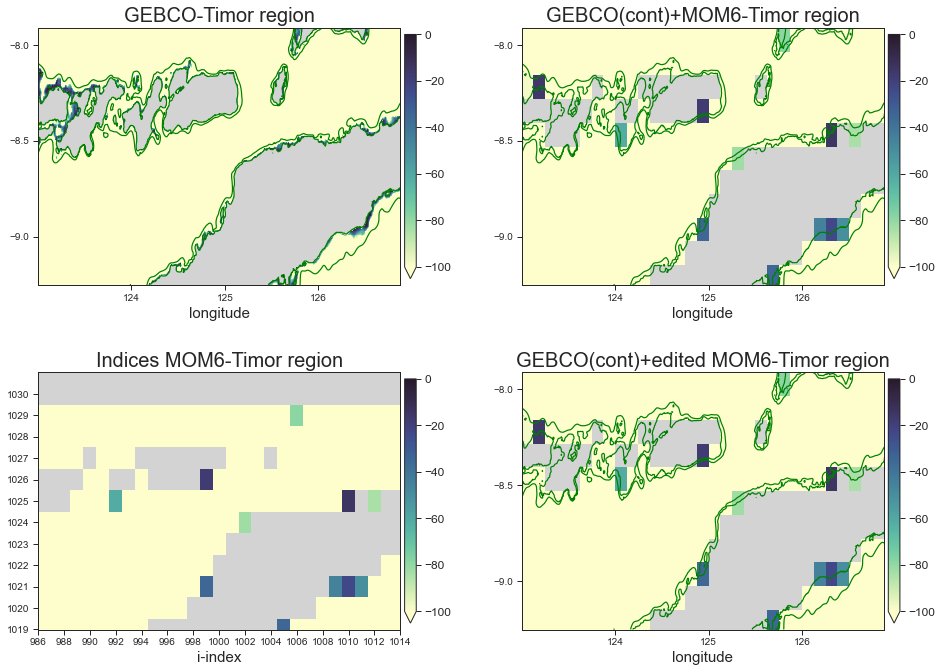

In [120]:
# View further east towards Timor (no edits)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)

# now back out the roll and place into height_model (need to check this!)
#shift = -60*8
#height_model  = np.roll(height_model_roll,shift,axis=1)


fieldA = height_model0_roll
center_lon=125. ; center_lat=-8.5 ; width_lon=4.0 ; width_lat=1.5
vmin=-100.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Timor region', iskip=2, jskip=1, ioff=2, joff=0)

(jsouthG,iwestG) =  18779 , 72960
(jnorthG,ieastG) =  19859 , 73920
from get_indices, wanted:  124.0 -11.75
from get_indices, got:     124.0 -11.729696980110973
999 992
from get_indices, wanted:  128.0 -7.25
from get_indices, got:     128.0 -7.29272860344118
1035 1024
(jsouthM,iwestM) =  999 , 992
(jnorthM,ieastM) =  1035 , 1024


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


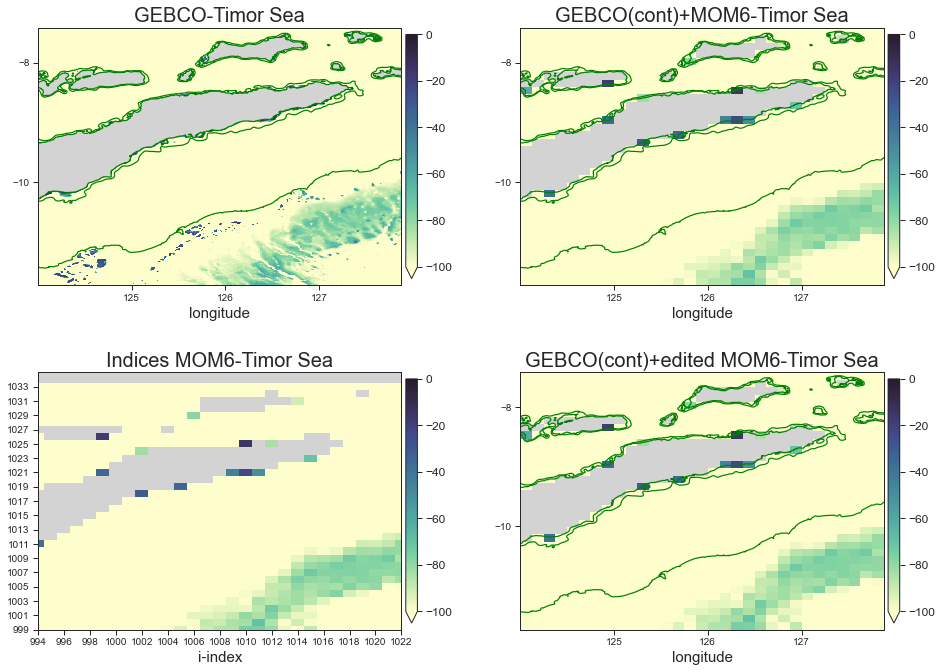

In [121]:
# View of Timor Sea (no edits)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)

# now back out the roll and place into height_model (need to check this!)
#shift = -60*8
#height_model  = np.roll(height_model_roll,shift,axis=1)


fieldA = height_model0_roll
center_lon=126. ; center_lat=-9.50 ; width_lon=4.0 ; width_lat=4.5
vmin=-100.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Timor Sea', iskip=2, jskip=2, ioff=2, joff=0)

(jsouthG,iwestG) =  20219 , 72360
(jnorthG,ieastG) =  20819 , 73080
from get_indices, wanted:  121.5 -5.75
from get_indices, got:     121.5 -5.802555638805021
1047 972
from get_indices, wanted:  124.5 -3.25
from get_indices, got:     124.5 -3.310656222788353
1067 996
(jsouthM,iwestM) =  1047 , 972
(jnorthM,ieastM) =  1067 , 996


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


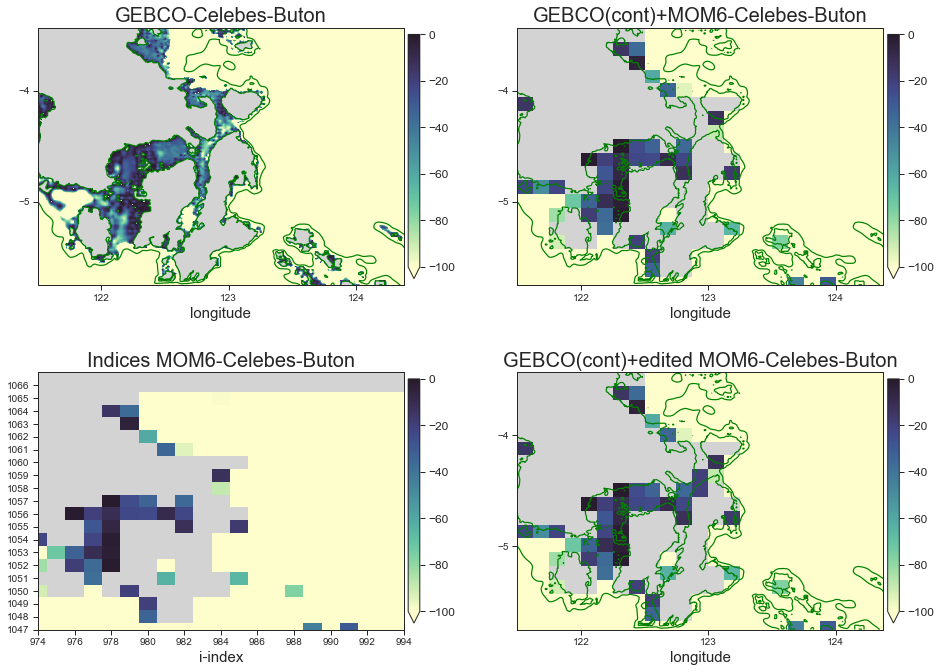

In [122]:
# Edits to disconnect Buton from Celebes. 
# Allow Muna and Buton to be merged into a single island  (edits made)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)
height_model_roll[1057,983] = -20.0
height_model_roll[1058,983] = -20.0

# now back out the roll and place into height_model (need to check this!)
shift = -60*8
height_model  = np.roll(height_model_roll,shift,axis=1)

fieldA = height_model0_roll
center_lon=123. ; center_lat=-4.5 ; width_lon=3.0 ; width_lat=2.5
vmin=-100.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Celebes-Buton', iskip=2, jskip=1, ioff=2, joff=0)

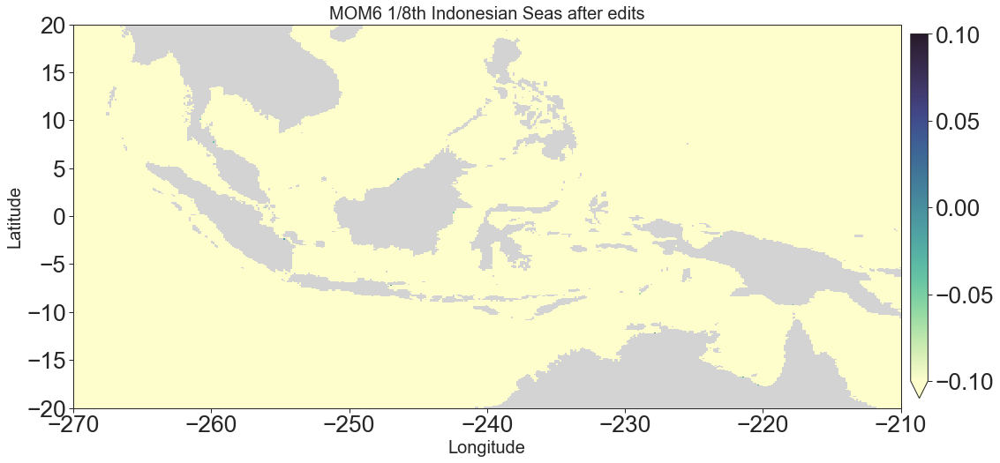

In [123]:
#Broad view of Indonesian Seas after the edits 

vmax=0.0
vmin=-0.0
field = height_model0
x = xmodel_q
y = ymodel_q
xlim = (-270,-210)
ylim = (-20,20)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')

plt.title('MOM6 1/8th Indonesian Seas after edits', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

In [124]:
# ---------------------------------------------------------------------- 
# -----------------Phillipines-----------------------------------
# ---------------------------------------------------------------------- 

(jsouthG,iwestG) =  22799 , 71760
(jnorthG,ieastG) =  24239 , 73680
from get_indices, wanted:  119.0 5.0
from get_indices, got:     119.0 5.055925661656447
1134 952
from get_indices, wanted:  127.0 11.0
from get_indices, got:     127.0 10.994401022085166
1182 1016
(jsouthM,iwestM) =  1134 , 952
(jnorthM,ieastM) =  1182 , 1016


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


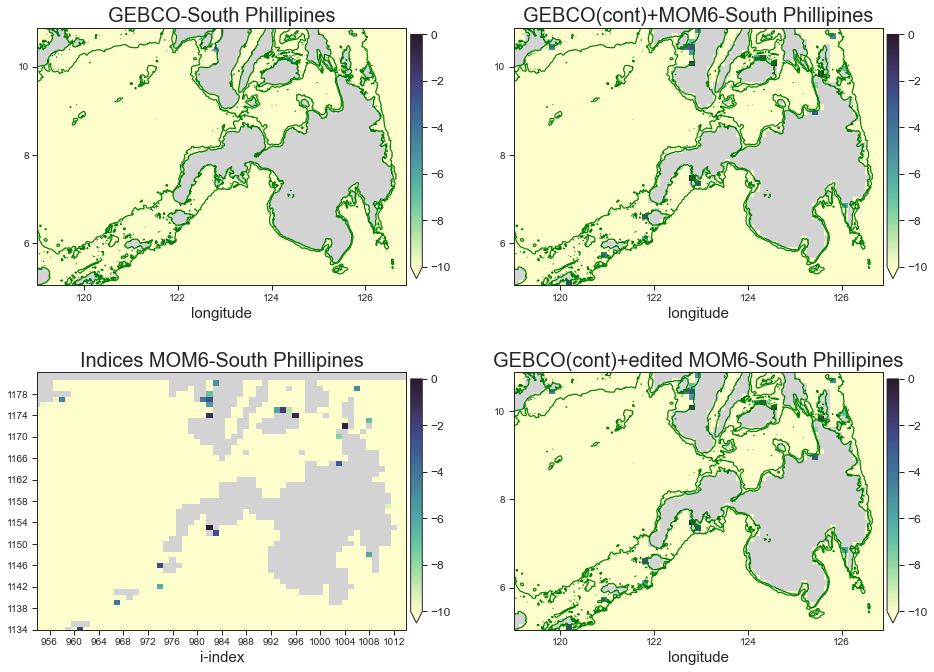

In [125]:
# View of South Phillipine Islands (no edits)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)

# now back out the roll and place into height_model (need to check this!)
#shift = -60*8
#height_model  = np.roll(height_model_roll,shift,axis=1)

fieldA = height_model0_roll
center_lon=123. ; center_lat=8 ; width_lon=8.0 ; width_lat=6.0
vmin=-10.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='South Phillipines', iskip=4, jskip=4, ioff=2, joff=0)

(jsouthG,iwestG) =  23759 , 71760
(jnorthG,ieastG) =  25199 , 73680
from get_indices, wanted:  119.0 9.0
from get_indices, got:     119.0 9.024947190177215
1166 952
from get_indices, wanted:  127.0 15.0
from get_indices, got:     127.0 15.01270827601589
1215 1016
(jsouthM,iwestM) =  1166 , 952
(jnorthM,ieastM) =  1215 , 1016


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


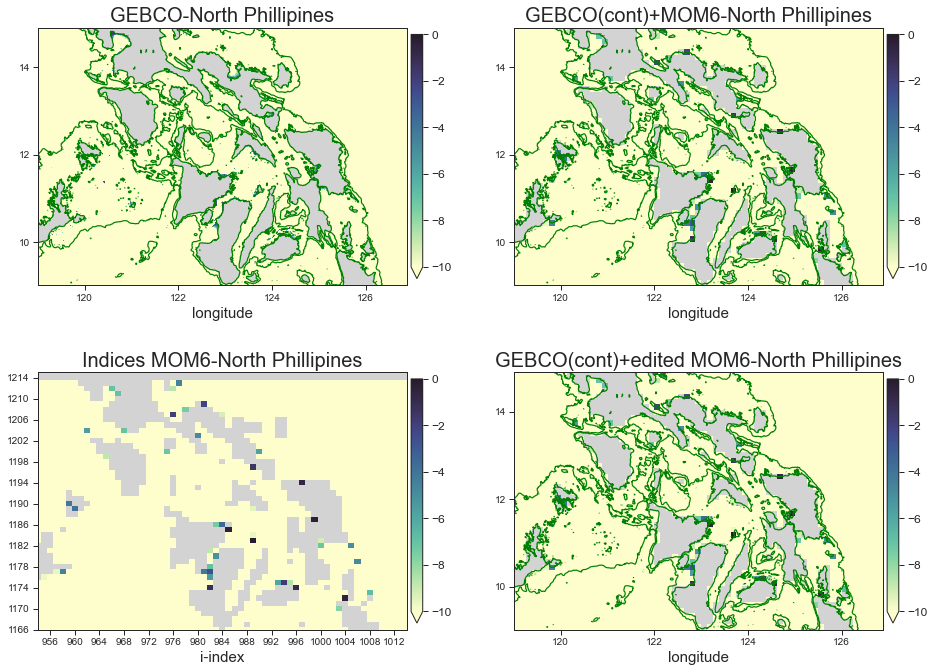

In [126]:
# View of North Phillipine Islands (no edits)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)

# now back out the roll and place into height_model (need to check this!)
#shift = -60*8
#height_model  = np.roll(height_model_roll,shift,axis=1)

fieldA = height_model0_roll
center_lon=123. ; center_lat=12 ; width_lon=8.0 ; width_lat=6.0
vmin=-10.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='North Phillipines', iskip=4, jskip=4, ioff=2, joff=0)

In [127]:
# ---------------------------------------------------------------------- 
# -----------------Yellow Sea and Sea of Japan-------------------------
# ---------------------------------------------------------------------- 

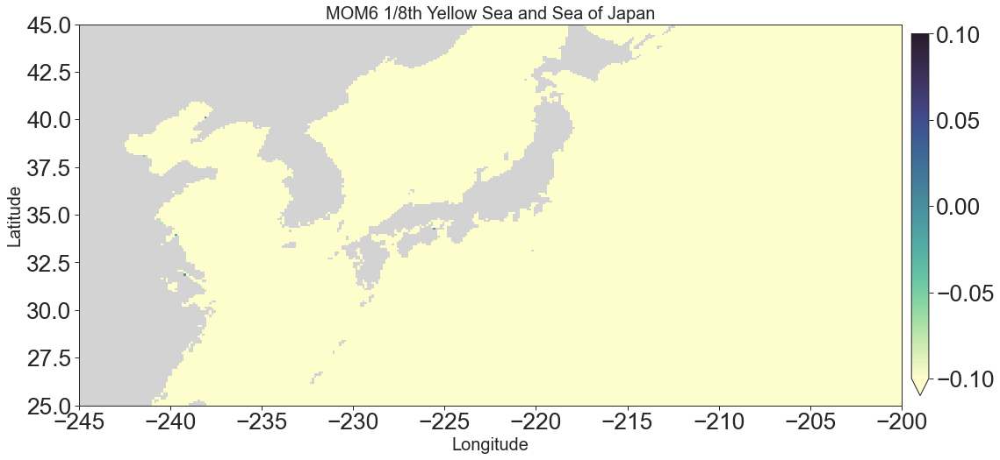

In [128]:
#Broad view of Yellow Sea and Sea of Japan (no edits)

vmax=0.0
vmin=-0.0
field = height_model0
x = xmodel_q
y = ymodel_q
xlim = (-245,-200)
ylim = (25,45)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('MOM6 1/8th Yellow Sea and Sea of Japan', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

(jsouthG,iwestG) =  29399 , 74280
(jnorthG,ieastG) =  29879 , 75000
from get_indices, wanted:  129.5 32.5
from get_indices, got:     129.5 32.533641079783855
1369 1036
from get_indices, wanted:  132.5 34.5
from get_indices, got:     132.5 34.51339669407707
1388 1060
(jsouthM,iwestM) =  1369 , 1036
(jnorthM,ieastM) =  1388 , 1060


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


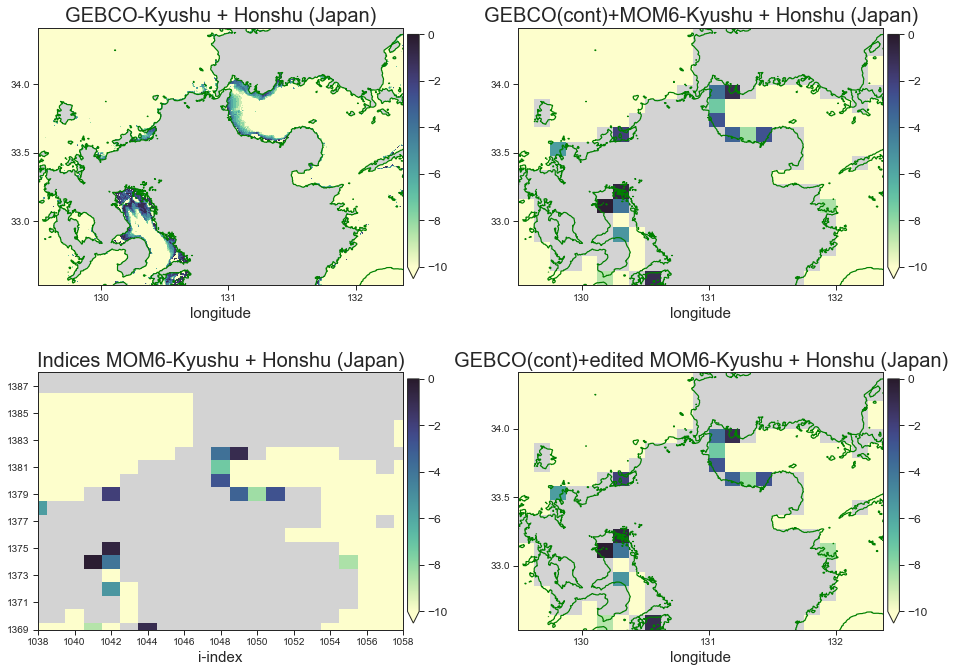

In [129]:
# Kyushu from Honshu Japanese islands (no edits; keep them linked) 

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)

# now back out the roll and place into height_model (need to check this!)
#shift = -60*8
#height_model  = np.roll(height_model_roll,shift,axis=1)

fieldA = height_model0_roll
center_lon=131. ; center_lat=33.5 ; width_lon=3.0 ; width_lat=2.0
vmin=-10.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Kyushu + Honshu (Japan)', iskip=2, jskip=2, ioff=2, joff=0)

(jsouthG,iwestG) =  31319 , 76560
(jnorthG,ieastG) =  31799 , 77520
from get_indices, wanted:  139.0 40.5
from get_indices, got:     139.0 40.458836742034784
1448 1112
from get_indices, wanted:  143.0 42.5
from get_indices, got:     143.0 42.51854021484245
1470 1144
(jsouthM,iwestM) =  1448 , 1112
(jnorthM,ieastM) =  1470 , 1144


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


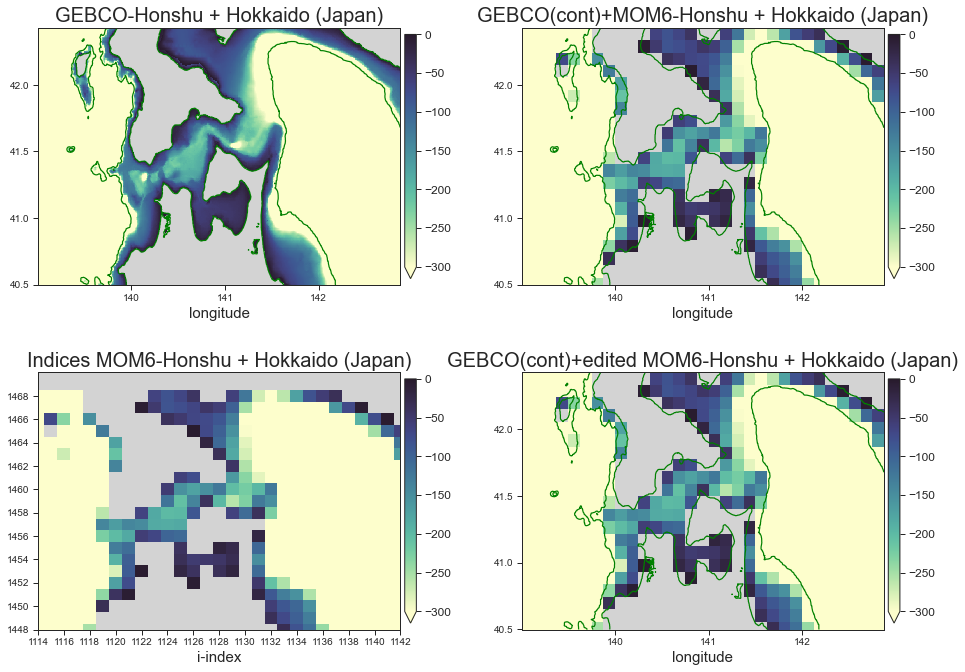

In [130]:
# Check Honshu and Hokkaido Japanese islands (no edits)

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)

# now back out the roll and place into height_model (need to check this!)
#shift = -60*8
#height_model  = np.roll(height_model_roll,shift,axis=1)

fieldA = height_model0_roll
center_lon=141. ; center_lat=41.5 ; width_lon=4.0 ; width_lat=2.0
vmin=-300.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Honshu + Hokkaido (Japan)', iskip=2, jskip=2, ioff=2, joff=0)

In [131]:
# ---------------------------------------------------------------------- 
# -----------------Northwest Pacific-------------------------
# ---------------------------------------------------------------------- 

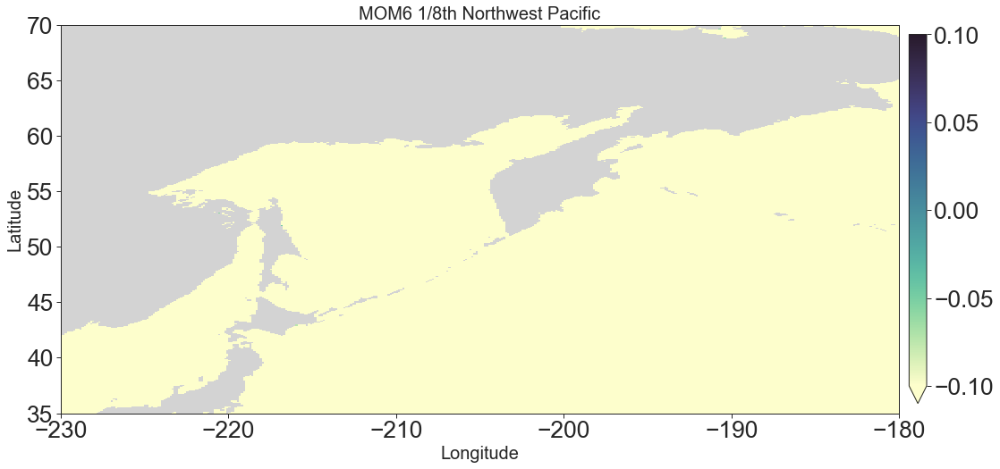

In [132]:
# Broad view of Northwest Pacific

vmax=0.0
vmin=-0.0
field = height_model0
x = xmodel_q
y = ymodel_q
xlim = (-230,-180)
ylim = (35,70)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('MOM6 1/8th Northwest Pacific', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

(jsouthG,iwestG) =  34008 , 76920
(jnorthG,ieastG) =  34248 , 77400
from get_indices, wanted:  140.5 51.7
from get_indices, got:     140.5 51.67618872258733
1578 1124
from get_indices, wanted:  142.5 52.7
from get_indices, got:     142.5 52.672681263378344
1591 1140
(jsouthM,iwestM) =  1578 , 1124
(jnorthM,ieastM) =  1591 , 1140


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


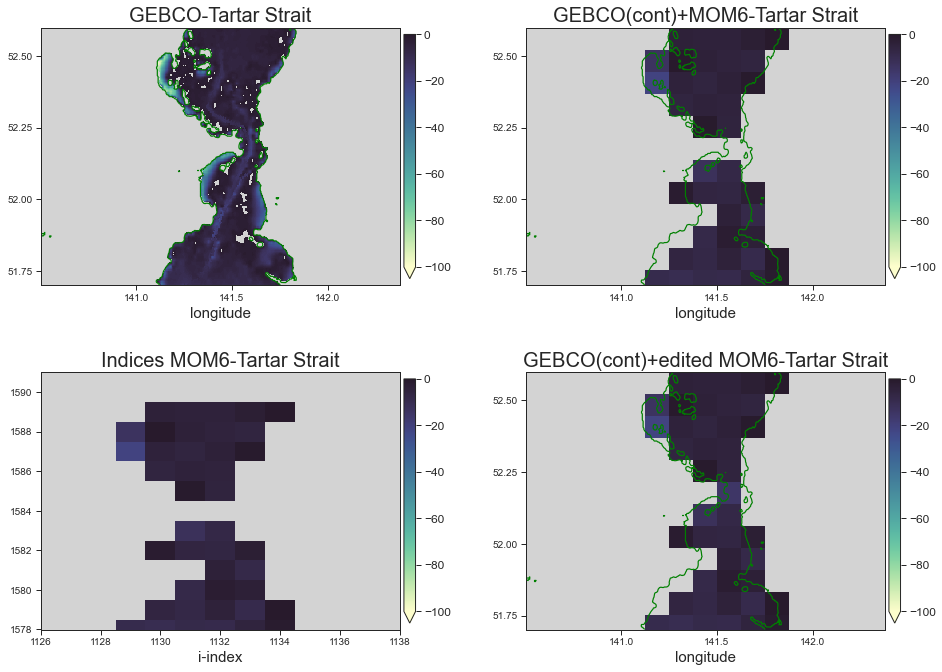

In [133]:
# Edit to open the Tartar Strait between Sakhalin and Russia (edits made)

# For MOM6 channel table 
# V_width, 141.4, 141.7, 52.1,  52.2, 2500.0  ! Between Sakhalin and Russia

shift = 60*8
height_model_roll  = np.roll(height_model,shift,axis=1)
height_model_roll[1584,1132] = -15.0

# now back out the roll and place into height_model 
shift = -60*8
height_model = np.roll(height_model_roll,shift,axis=1)

fieldA = height_model0_roll
center_lon=141.5 ; center_lat=52.2 ; width_lon=2.0 ; width_lat=1.0
vmin=-100.0 ; vmax=0.0; 


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q_roll, ymodel_q_roll, height_gebco, fieldA, fieldA, height_model_roll, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Tartar Strait', iskip=2, jskip=2, ioff=2, joff=0)

In [134]:
# ---------------------------------------------------------------------- 
# -----------------Northeast Pacific-------------------------
# ---------------------------------------------------------------------- 

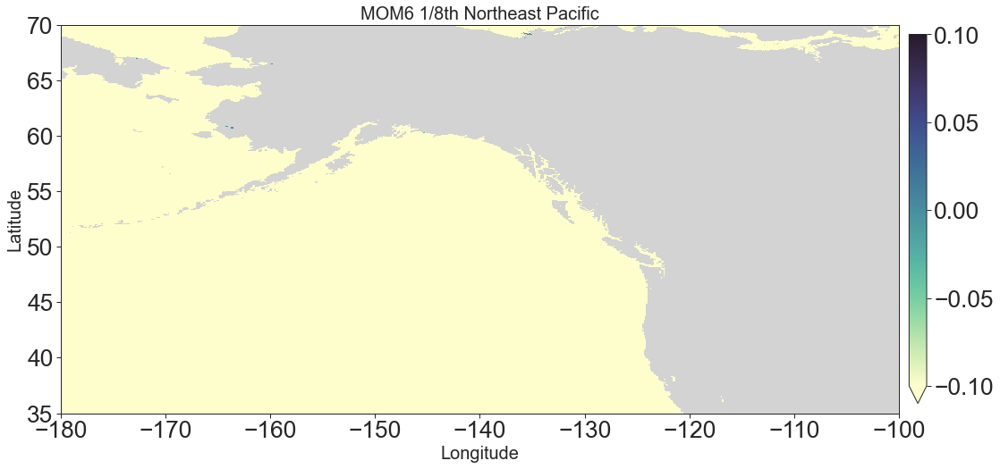

In [135]:
#Broad view of Northeast Pacific (no edits)

vmax=0.0
vmin=-0.0
field = height_model0
x = xmodel_q
y = ymodel_q
xlim = (-180,-100)
ylim = (35,70)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')

plt.title('MOM6 1/8th Northeast Pacific', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

In [136]:
# ---------------------------------------------------------------------- 
# ----------------Gulf of Mexico and Caribbean Sea-------------------------
# ---------------------------------------------------------------------- 

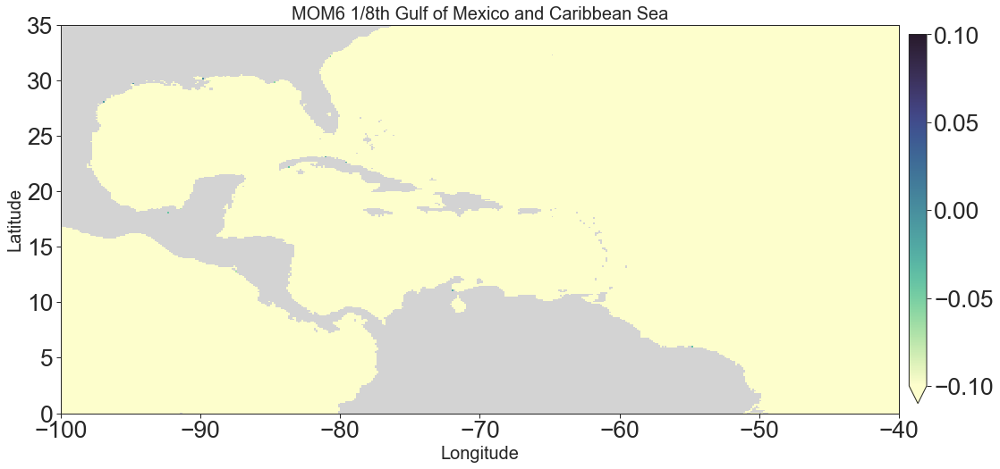

In [137]:
#Broad view of Gulf of Mexico and Caribbean Sea

vmax=0.0
vmin=-0.0
field = height_model0
x = xmodel_q
y = ymodel_q
xlim = (-100,-40)
ylim = (0,35)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('MOM6 1/8th Gulf of Mexico and Caribbean Sea', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

In [138]:
# ---------------------------------------------------------------------- 
# ----------------South America-------------------------
# ---------------------------------------------------------------------- 

(jsouthG,iwestG) =  23999 , 25799
(jnorthG,ieastG) =  24479 , 26279
from get_indices, wanted:  -72.5 10.0
from get_indices, got:     -72.5 10.011167866083417
1174 1820
from get_indices, wanted:  -70.5 12.0
from get_indices, got:     -70.5 11.974367096851147
1190 1836
(jsouthM,iwestM) =  1174 , 1820
(jnorthM,ieastM) =  1190 , 1836


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


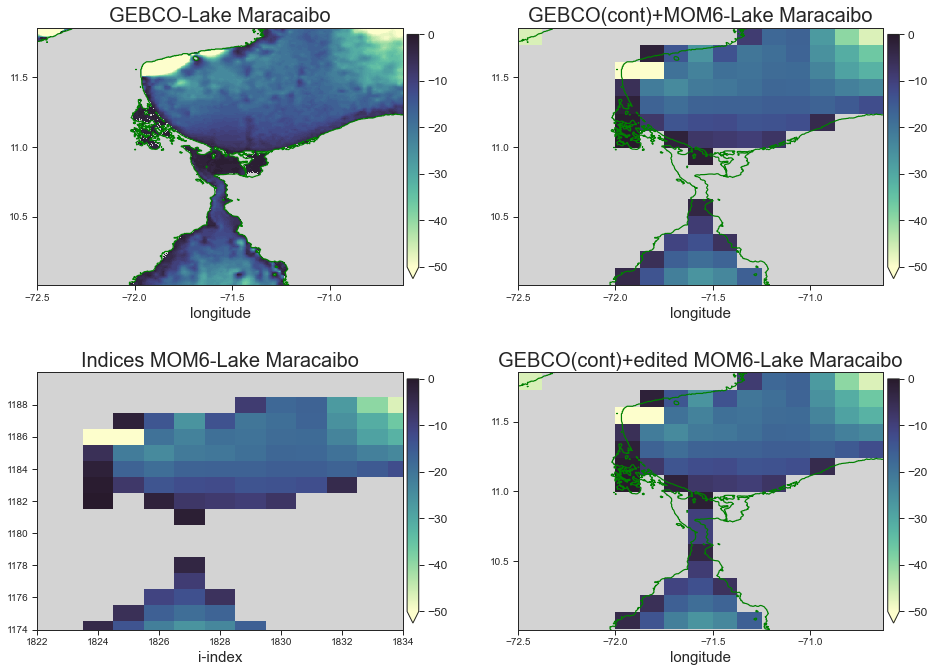

In [139]:
# Edits to open Lake Maracaibo in Northern Venezuela 

fieldA = height_model0
center_lon=-71.5 ; center_lat=11 ; width_lon=2.0 ; width_lat=2.0
vmin=-50.0 ; vmax=0.0; 

height_model[1180,1827] = -10.0
height_model[1179,1827] = -10.0

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Lake Maracaibo', iskip=2, jskip=2, ioff=2, joff=0)


(jsouthG,iwestG) =  20879 , 30599
(jnorthG,ieastG) =  22079 , 31799
from get_indices, wanted:  -52.5 -3.0
from get_indices, got:     -52.5 -3.061042791382075
1069 1980
from get_indices, wanted:  -47.5 2.0
from get_indices, got:     -47.5 2.062054708202367
1110 2020
(jsouthM,iwestM) =  1069 , 1980
(jnorthM,ieastM) =  1110 , 2020


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


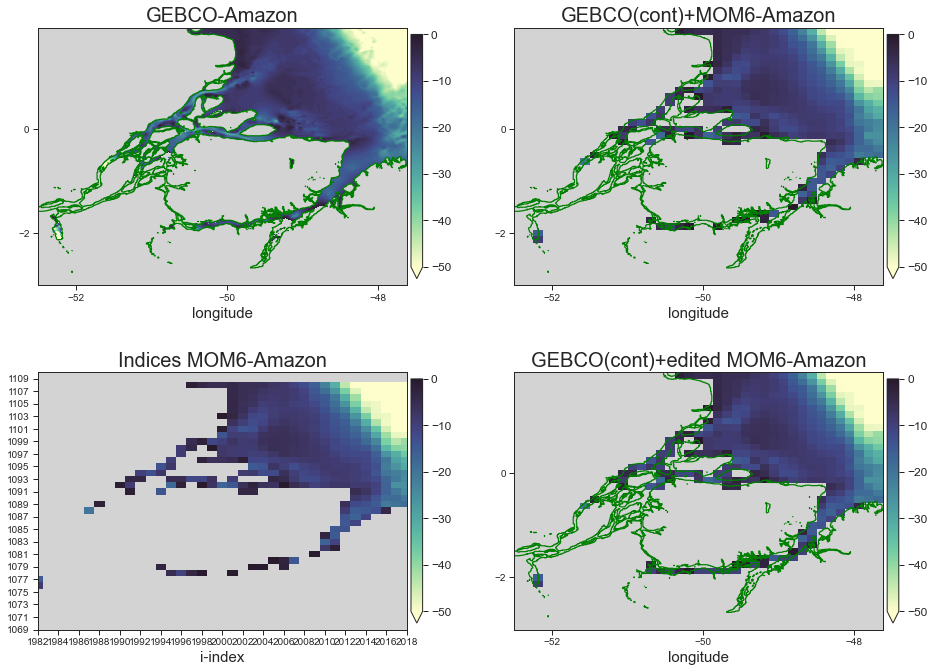

In [140]:
# Edits to open some of the channels at the mouth of Amazon

fieldA = height_model0
center_lon=-50. ; center_lat=-.5 ; width_lon=5.0 ; width_lat=5.0
vmin=-50.0 ; vmax=0.0; 

height_model[1094,1995] = -10.0
height_model[1096,1996] = -10.0

height_model[1091,1995] = -10.0

height_model[1093,2002] = -10.0

height_model[1080,2008] = -10.0
height_model[1080,2009] = -10.0
height_model[1081,2010] = -10.0
height_model[1079,2005] = -10.0
height_model[1078,1994] = -10.0
height_model[1078,1999] = -10.0
height_model[1078,2000] = -10.0
height_model[1078,2001] = -10.0
height_model[1078,2002] = -10.0
height_model[1078,2003] = -10.0


map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Amazon', iskip=2, jskip=2, ioff=2, joff=0)

In [141]:
# ---------------------------------------------------------------------- 
# ----------------North Atlantic-------------------------
# ---------------------------------------------------------------------- 

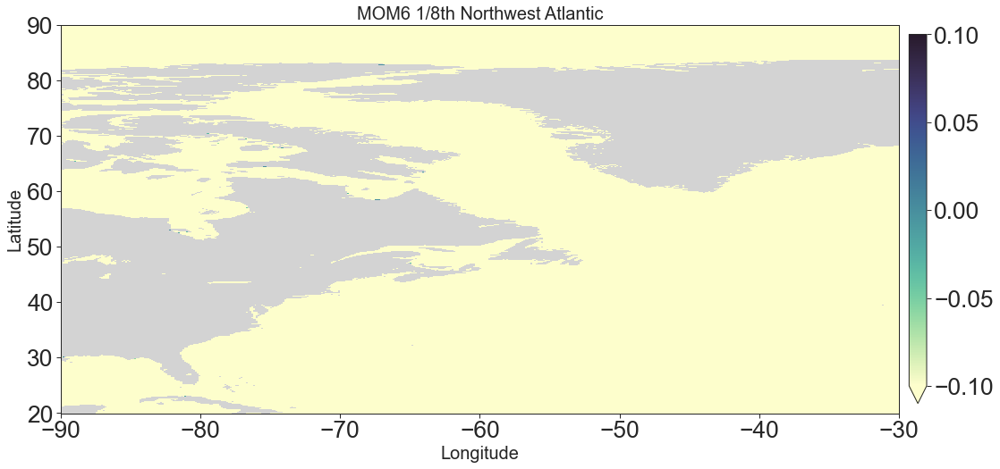

In [142]:
#Broad view of Nortwest Atlantic

vmax=0.0
vmin=-0.0
field = height_model0
x = xmodel_q
y = ymodel_q
xlim = (-90,-30)
ylim = (20,90)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
#cbar = plt.colorbar()
plt.title('MOM6 1/8th Northwest Atlantic', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

(jsouthG,iwestG) =  31368 , 26159
(jnorthG,ieastG) =  31848 , 26639
from get_indices, wanted:  -71.0 40.7
from get_indices, got:     -71.0 40.74355765955596
1451 1832
from get_indices, wanted:  -69.0 42.7
from get_indices, got:     -69.0 42.7025331513145
1472 1848
(jsouthM,iwestM) =  1451 , 1832
(jnorthM,ieastM) =  1472 , 1848


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


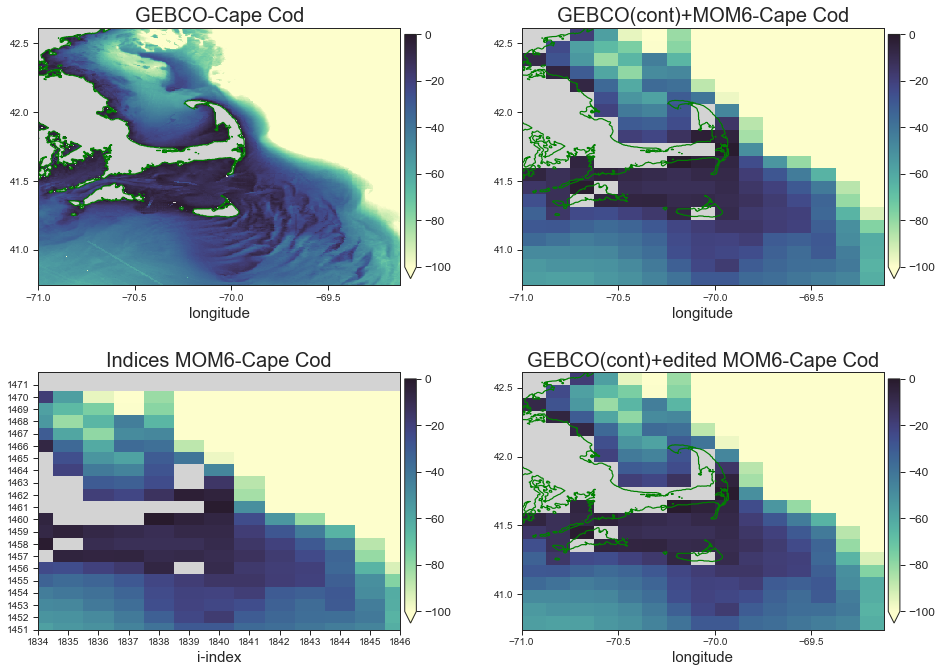

In [143]:
# Edit to add one point to connect Cape Cod (edits made)

fieldA = height_model0
center_lon=-70. ; center_lat=41.7 ; width_lon=2.0 ; width_lat=2.0
vmin=-100.0 ; vmax=0.0; 

height_model[1462,1839] = 0.0
height_model = np.ma.array(height_model,mask=height_model>=0.0)

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Cape Cod', iskip=1, jskip=1, ioff=2, joff=0)

(jsouthG,iwestG) =  31199 , 25319
(jnorthG,ieastG) =  31679 , 26039
from get_indices, wanted:  -74.5 40.0
from get_indices, got:     -74.5 39.981609996241666
1443 1804
from get_indices, wanted:  -71.5 42.0
from get_indices, got:     -71.5 41.963302478151455
1464 1828
(jsouthM,iwestM) =  1443 , 1804
(jnorthM,ieastM) =  1464 , 1828


/tmp/ipykernel_2987980/825363864.py:43: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xgridG[iwestG:ieastG],


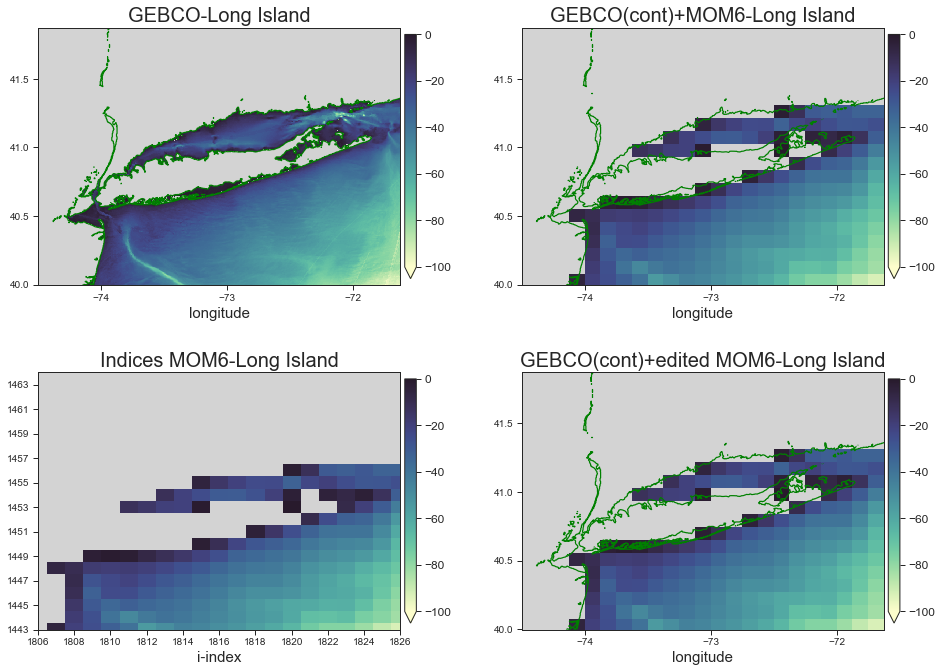

In [144]:
#View of New York's Long Island (no edits)

fieldA = height_model0
center_lon=-73. ; center_lat=41. ; width_lon=3.0 ; width_lat=2.0
vmin=-100.0 ; vmax=0.0; 

map_region_model_gebco(center_lon, center_lat, width_lon, width_lat, 
               xgebco, ygebco, xmodel_q, ymodel_q, height_gebco, fieldA, fieldA, height_model, 
               vmin=vmin, vmax=vmax, cmap=cmocean.cm.deep, rname='Long Island', iskip=2, jskip=2, ioff=2, joff=0)


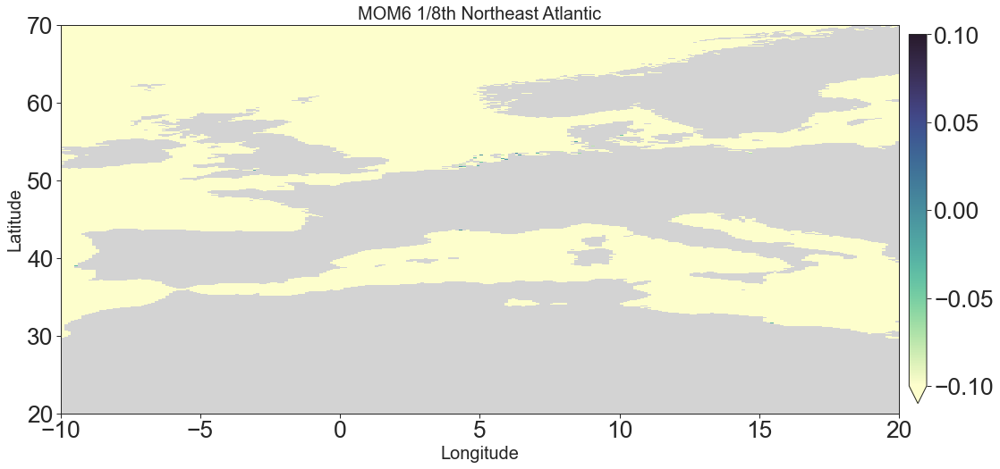

In [145]:
#Norteast Atlantic (no edits)

vmax=0.0
vmin=-0.0
field = height_model0
x = xmodel_q
y = ymodel_q
xlim = (-10,20)
ylim = (20,70)

plt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('MOM6 1/8th Northeast Atlantic', fontsize=20)
plt.xlim(xlim)
plt.ylim(ylim)    
   
plt.show()

In [146]:
# ---------------------------------------------------------------------- 
# -----Apply ice9---------------------------
# ---------------------------------------------------------------------- 

In [147]:
# Do ice9 to fill inland seas and lakes.  

# Warning: This step should be done after all other edits since 
# some edits might open up straits that we wish ice9 to know about.
# A case-in-point is the Black Sea. 

# ice9 works on unmasked arrays. 
height_model_ice9 = np.ma.filled(height_model, fill_value=0.0)

# Seed can be any wet ocean point.
jseed,iseed=get_indices(xmodel_q, ymodel_q, -150.0, 0.0)
ice9_mask = ice9it(iseed,jseed, height_model_ice9)

# Zero out inland seas and lakes.
height_model_ice9 = height_model_ice9 * ice9_mask

# Apply masking for nicer maps. 
height_model_ice9 = np.ma.masked_equal(height_model_ice9, 0.0, copy=True)

# Compute difference made by ice9 application. 
height_diff = height_model_ice9 - height_model
height_diff = np.ma.filled(height_diff, fill_value=0.0)


print(xmodel_q[jseed,iseed],ymodel_q[jseed,iseed], wet_model[jseed,iseed], height_model[jseed,iseed], height_model_ice9[jseed,iseed])

from get_indices, wanted:  -150.0 0.0
from get_indices, got:     -150.0 -0.06249998760508915
1093 1200
-150.0 -0.06249998760508915 1.0 -4309.65625 -4309.65625


In [149]:
# save to netCDF file. 
# MOM6 expects depth. 

depth = -1.0*height_model_ice9
depth = np.ma.filled(depth, fill_value=0.0)

nx = np.max(depth[1,:].shape)
ny = np.max(depth[:,1].shape)
xlon = np.arange(nx)
ylat = np.arange(ny)
lon  = xr.DataArray(data=xlon, dims=('lon'))
lat  = xr.DataArray(data=ylat, dims=('lat'))
topog_darray = xr.DataArray(data=depth, dims=('lat', 'lon'))
topog_darray = topog_darray.assign_coords({'lat': lat, 'lon': lon})

topog_ds = xr.Dataset()
topog_ds['depth'] = topog_darray
topog_ds.to_netcdf('ocean_topog.nc', mode='w')

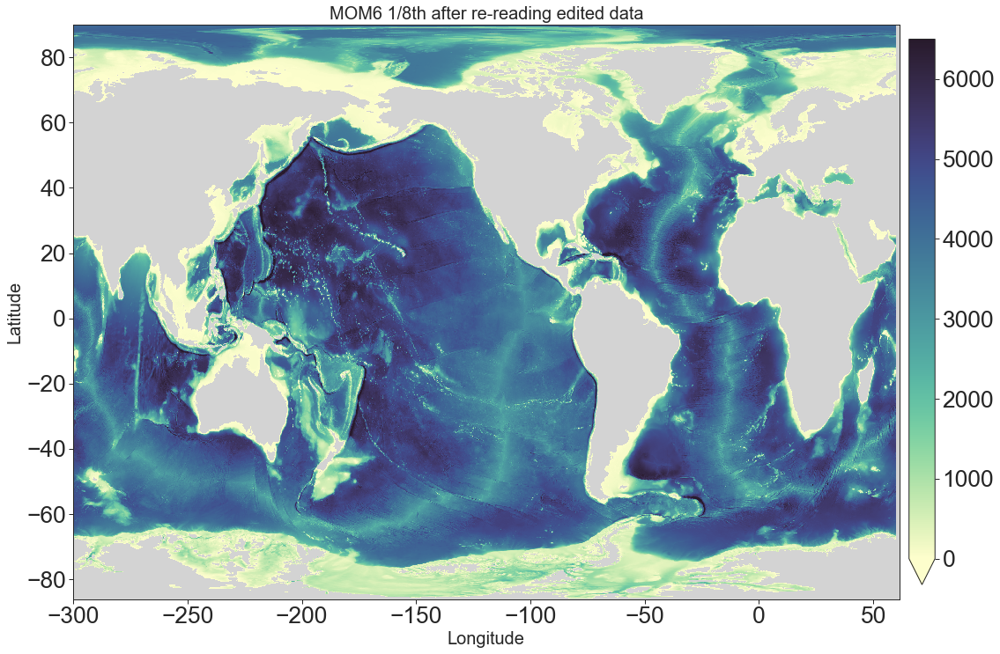

In [150]:
# check to be sure writing proper data 

fname  = "/net/smg/OWG/CM4_highres/topog/ocean_topog.nc"
test   = netCDF4.Dataset(fname)
depth_test = test.variables['depth']
depth_test = np.ma.masked_less_equal(depth_test, 0.0, copy=True)

vmin=0.0
vmax=6500.0
field = depth_test
x = xmodel_q
y = ymodel_q

plt.figure(figsize=(20,12)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')

plt.title('MOM6 1/8th after re-reading edited data', fontsize=20)
#cbar.ax.tick_params(labelsize=8) 
   
plt.show()

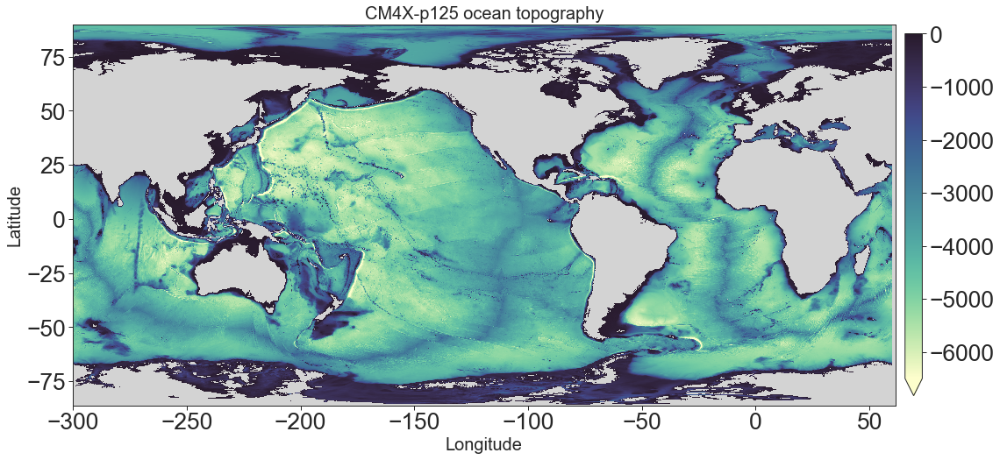

In [151]:
#MOM topog height 

vmax=0.0
vmin=-6500.0
field = height_model_ice9
x = xmodel_q
y = ymodel_q

fig = plt.figure(figsize=[20,8])
#lt.figure(figsize=(20,8)) 
plt.pcolormesh(x,y,field,cmap=cmocean.cm.deep,linewidths=0.25, 
               vmin=vmin, vmax=vmax)  
#plt.pcolormesh(x,y,field,cmap=cmocean.cm.topo,linewidths=0.25, 
#               vmin=vmin, vmax=vmax)  

plt.gca().set_facecolor('lightgray')
#plt.xticks(fontsize=10)
#plt.yticks(fontsize=10)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
#cbar = plt.colorbar()
cbar = plt.colorbar(pad=0.01,spacing='uniform', extend='min', 
                    shrink=0.95,orientation='vertical')
plt.title('CM4X-p125 ocean topography', fontsize=20)
#cbar.ax.tick_params(labelsize=8) 
   
plt.show()
fig.savefig('CM4Xp125_Topog.png', bbox_inches='tight', dpi=150)